<a href="https://colab.research.google.com/github/abhikr1302/EDA-Hotel-Booking/blob/main/My_Hotel_Booking_Analysis_17th_Aug_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <b> Have you ever wondered when the best time of year to book a hotel room is? Or the optimal length of stay in order to get the best daily rate? What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests? This hotel booking dataset can help you explore those questions!

## <b>This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things. All personally identifying information has been removed from the data. </b>

## <b> Explore and analyze the data to discover important factors that govern the bookings. </b>

## **Loading the data**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
from datetime import date
import plotly.express as px

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv('/content/drive/MyDrive/ Hotel Bookings.csv')

# **Understanding the data**

In [ ]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [ ]:
df.T

,0,1,2,3,4,5,6,7,8,9,...,119380,119381,119382,119383,119384,119385,119386,119387,119388,119389
hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,Resort Hotel,...,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel,City Hotel
is_canceled,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
lead_time,342,737,7,13,14,14,0,9,85,75,...,44,188,135,164,21,23,102,34,109,205
arrival_date_year,2015,2015,2015,2015,2015,2015,2015,2015,2015,2015,...,2017,2017,2017,2017,2017,2017,2017,2017,2017,2017
arrival_date_month,July,July,July,July,July,July,July,July,July,July,...,August,August,August,August,August,August,August,August,August,August
arrival_date_week_number,27,27,27,27,27,27,27,27,27,27,...,35,35,35,35,35,35,35,35,35,35
arrival_date_day_of_month,1,1,1,1,1,1,1,1,1,1,...,31,31,30,31,30,30,31,31,31,29
stays_in_weekend_nights,0,0,0,0,0,0,0,0,0,0,...,1,2,2,2,2,2,2,2,2,2
stays_in_week_nights,0,0,1,1,2,2,2,2,3,3,...,3,3,4,4,5,5,5,5,5,7
adults,2,2,1,1,2,2,2,2,2,2,...,2,2,3,2,2,2,3,2,2,2


In [ ]:
df.shape

(119390, 32)

In [ ]:
df.dtypes

hotel                              object
is_canceled                         int64
lead_time                           int64
arrival_date_year                   int64
arrival_date_month                 object
arrival_date_week_number            int64
arrival_date_day_of_month           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                          float64
babies                              int64
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
agent                             

In [ ]:
df.isnull().sum().sort_values(ascending=False)

company                           112593
agent                              16340
country                              488
children                               4
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
hotel                                  0
previous_cancellations                 0
days_in_waiting_list                   0
customer_type                          0
adr                                    0
required_car_parking_spaces            0
total_of_special_requests              0
reservation_status                     0
previous_bookings_not_canceled         0
is_repeated_guest                      0
is_canceled                            0
distribution_channel                   0
market_segment                         0
meal                                   0
babies                                 0
adults                                 0
stays_in_week_ni

In [ ]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [ ]:
df.size

3820480

In [ ]:
df.shape

(119390, 32)

In [ ]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

## **Cleaning the Data**

> by dropping values which didnt seem relevant for our study.

*  arrival_date_week_number,company and agent

In [ ]:
df.drop(['arrival_date_week_number','company','agent'], axis=1, inplace=True)

# Cancellation Concepts based on following details


> Getting the total number of guests in one column.



In [ ]:
df['kids']=df['babies'] + df['children']

In [ ]:
df.isna().sum()

hotel                               0
is_canceled                         0
lead_time                           0
arrival_date_year                   0
arrival_date_month                  0
arrival_date_day_of_month           0
stays_in_weekend_nights             0
stays_in_week_nights                0
adults                              0
children                            4
babies                              0
meal                                0
country                           488
market_segment                      0
distribution_channel                0
is_repeated_guest                   0
previous_cancellations              0
previous_bookings_not_canceled      0
reserved_room_type                  0
assigned_room_type                  0
booking_changes                     0
deposit_type                        0
days_in_waiting_list                0
customer_type                       0
adr                                 0
required_car_parking_spaces         0
total_of_spe

# To further clean the data if the numerical value in a column is null and if the count of the null is nominal we can upload it to the medina value.
Here the null ount of children is just 4 out of 1lakh plus records. hence the method

In [ ]:
df['children'].median()

0.0

In [ ]:
df['children'].fillna(df['children'].median(), inplace=True)

In [ ]:
df.isna().sum()

hotel                               0
is_canceled                         0
lead_time                           0
arrival_date_year                   0
arrival_date_month                  0
arrival_date_day_of_month           0
stays_in_weekend_nights             0
stays_in_week_nights                0
adults                              0
children                            0
babies                              0
meal                                0
country                           488
market_segment                      0
distribution_channel                0
is_repeated_guest                   0
previous_cancellations              0
previous_bookings_not_canceled      0
reserved_room_type                  0
assigned_room_type                  0
booking_changes                     0
deposit_type                        0
days_in_waiting_list                0
customer_type                       0
adr                                 0
required_car_parking_spaces         0
total_of_spe

Further clean up of data. if a nominal count of string data is null then fill it by using the mode.Here the Null values of country is less than .5% so we can add the mode to null values

In [ ]:
df['country'].mode()

0    PRT
dtype: object

In [ ]:
df.loc[df['country'] == 'PRT', 'country'].count()

48590

In [ ]:
df['country'].fillna(df['country'].mode()[0], inplace=True)


In [ ]:
df.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests         0
reservation_status          

**DATA IS NOW CLEAN!!!!!**

Exploratory data analysis
Now we will start the analysis of our data
Firstly we will study the values which will affect th bookings done on the hotel.

# **Bookings based on the hotel type**

In [ ]:
df['hotel'].value_counts()

City Hotel      79330
Resort Hotel    40060
Name: hotel, dtype: int64

In [ ]:
df['reservation_status_date'].count()

119390

In [ ]:
hotel_date=df.groupby('hotel')['reservation_status_date'].value_counts()
hotel_date

hotel         reservation_status_date
City Hotel    2015-10-21                 1416
              2015-07-06                  763
              2015-01-01                  760
              2016-11-25                  746
              2016-01-18                  553
                                         ... 
Resort Hotel  2015-05-15                    1
              2015-05-30                    1
              2015-06-14                    1
              2015-06-20                    1
              2017-09-12                    1
Name: reservation_status_date, Length: 1777, dtype: int64

In [ ]:
# x.count()

# **Histogram to show the distribution of data throughout the values**

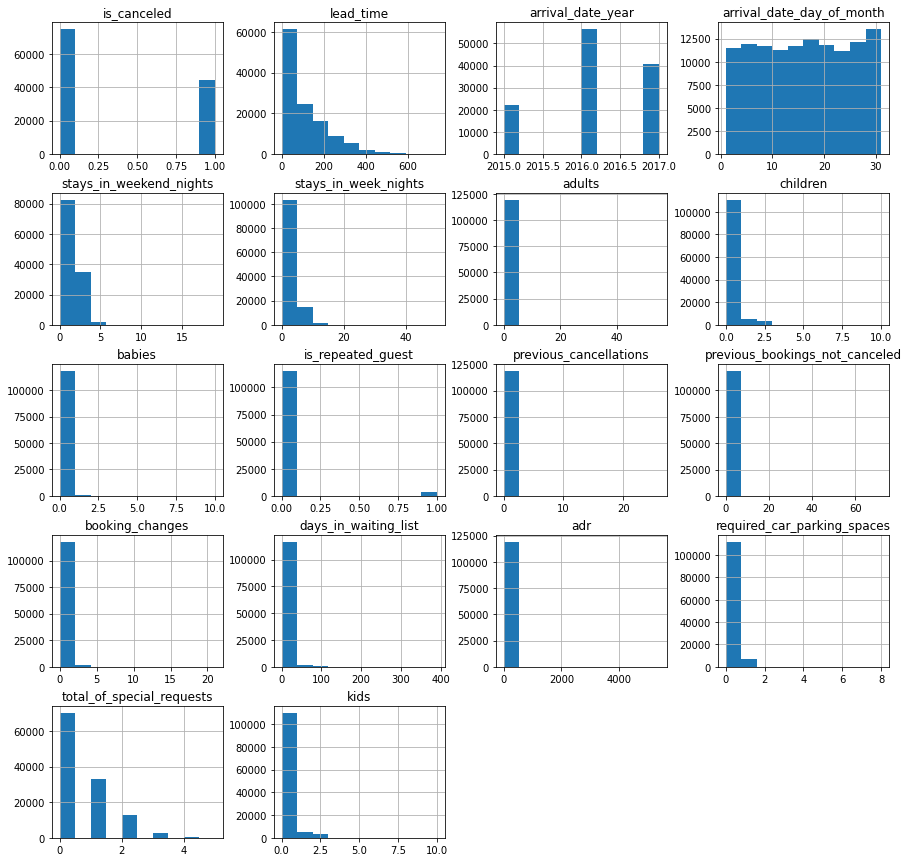

In [ ]:
df.hist(figsize=(15,15))
plt.show()

#**Handling outliers**

In [ ]:
# First Removing outliers by defining threshold based on common understanding
new_df = df.copy()

new_df.loc[new_df.stays_in_weekend_nights > 5,'stays_in_weekend_nights'] = 5
new_df.loc[new_df.stays_in_week_nights > 10,'stays_in_week_nights'] = 10
new_df.loc[new_df.adults > 4,'adults'] = 4
new_df.loc[new_df.children > 3,'children'] = 3
new_df.loc[new_df.babies > 3,'babies'] = 3
new_df.loc[new_df.required_car_parking_spaces > 3,'required_car_parking_spaces'] = 3
new_df.loc[new_df.previous_cancellations > 0,'previous_cancellations'] = 1
new_df.loc[new_df.previous_bookings_not_canceled > 0,'previous_bookings_not_canceled'] = 1
new_df.loc[new_df.booking_changes > 5,'booking_changes'] = 5

In [ ]:
# Removing outliers by standard methods and Plotting graphs:
for col in ['lead_time','adr']:
  # Using IQR method and capping to define the range of inliners:
  lower_cap, q1, q3, upper_cap, median = df[col].quantile([0.01,0.25,0.75,0.99,0.5])
  lower_limit = q1 - 1.5*(q3-q1)
  upper_limit = q3 + 1.5*(q3-q1)

  # Replacing Outliers with median value and Capping
  new_df[col] = np.where(new_df[col] > upper_limit, median,np.where(
                         new_df[col] < lower_limit,median,np.where(
                         new_df[col] < lower_cap,lower_cap,np.where(
                         new_df[col] > upper_cap,upper_cap,new_df[col]))))

In [ ]:
# Some columns have numeric values but those are actually categorical
categorical_features=["hotel","arrival_date_month","meal","country","market_segment","is_canceled",
                      "distribution_channel","reserved_room_type","assigned_room_type","deposit_type",
                      "customer_type","reservation_status","is_repeated_guest",'same_room','reservation_status_date',
                      'arrival_date_year','arrival_date_day_of_month','agent','company']

numeric_features = [i for i in df.columns if i not in categorical_features]
print(numeric_features)

['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'children', 'babies', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list', 'adr', 'required_car_parking_spaces', 'total_of_special_requests', 'kids']


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn

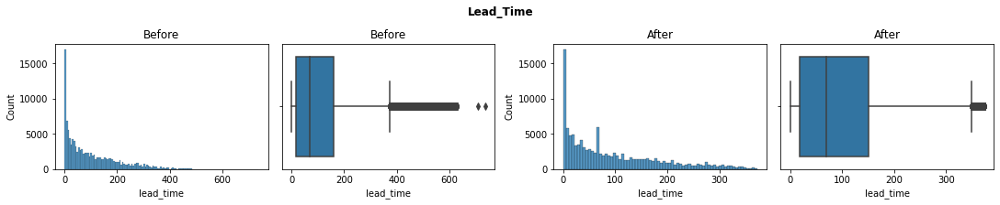

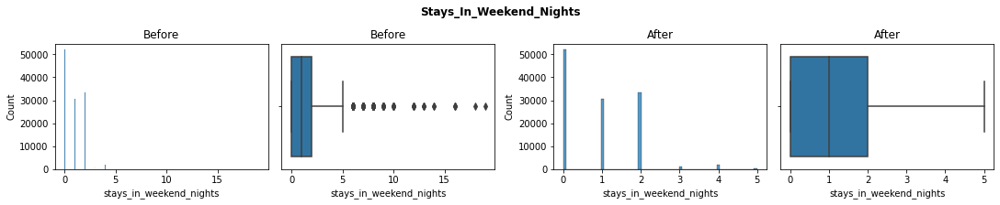

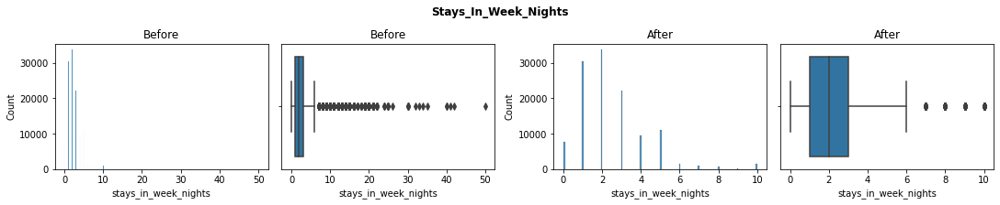

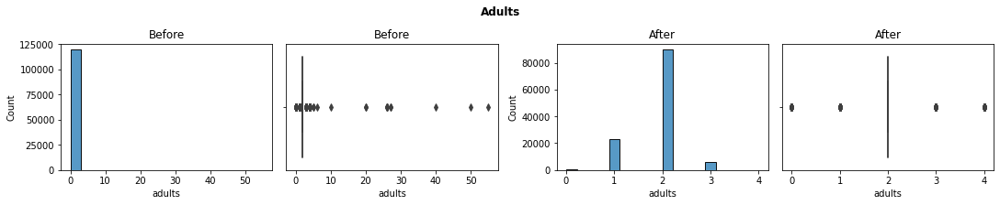

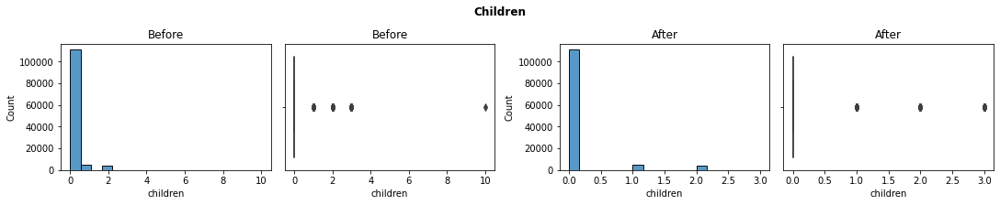

...

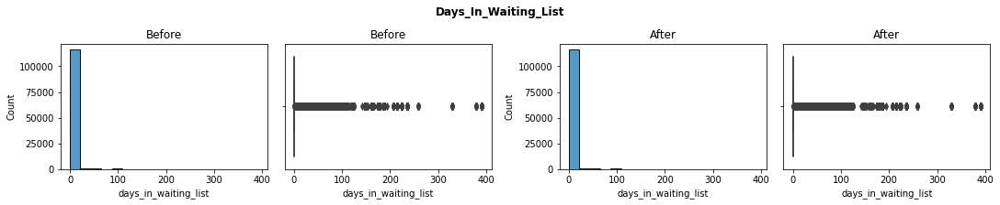

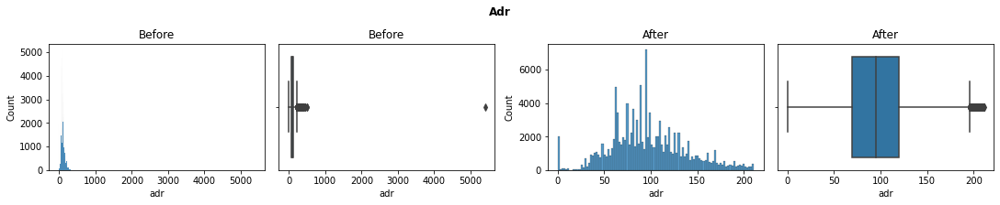

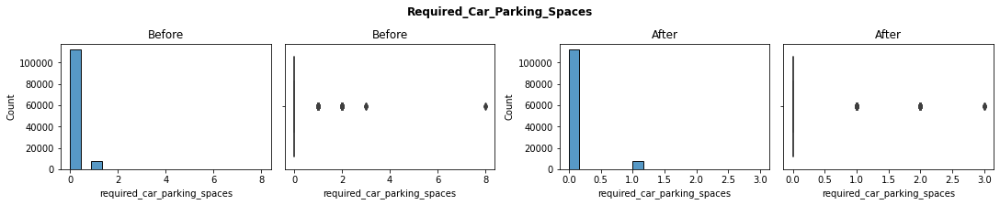

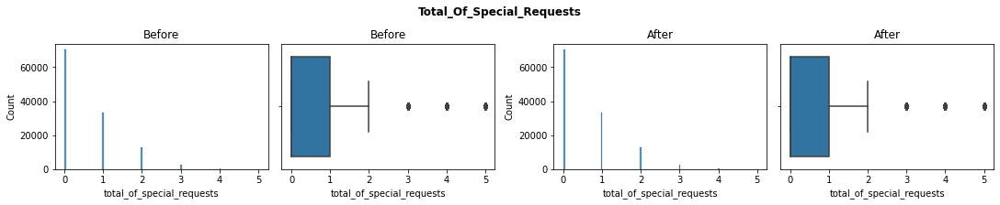

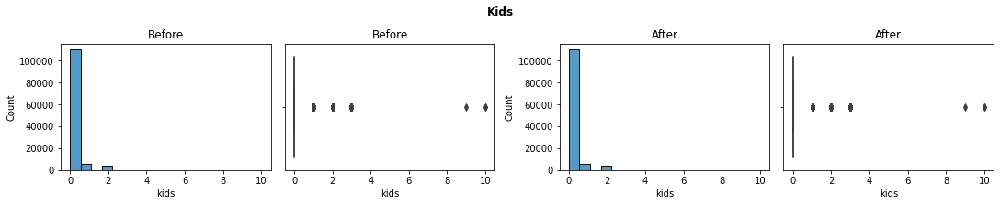

In [ ]:
#Plotting Graphs Before treating outliers 
for col in numeric_features:
  fig, ax =plt.subplots(1,4, constrained_layout=True)
  fig.set_size_inches(15, 3)
  sns.histplot(df[col], ax=ax[0]).set(title="Before")
  sns.boxplot(df[col], ax=ax[1]).set(title="Before")
  # After treating outliers
  sns.histplot(new_df[col], ax=ax[2]).set(title="After")
  sns.boxplot(new_df[col], ax=ax[3]).set(title="After")
  plt.suptitle(f'{col.title()}',weight='bold')
  fig.show()

## **Reservations in different Hotel Type**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


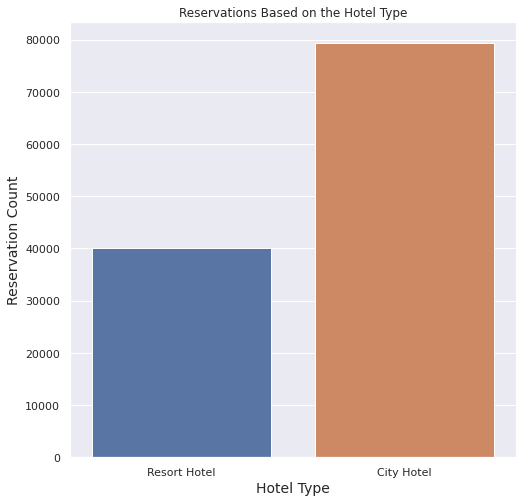

In [ ]:
# This graph shows the reservations made in both type of hotels- 'Resort Hotel','City Hotel'.
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(8,8)})
graph = sns.countplot('hotel', data = new_df)
graph.set(title='Reservations Based on the Hotel Type')
graph.set_xlabel('Hotel Type', fontsize = 14)
graph.set_ylabel('Reservation Count', fontsize = 14)
plt.show()

In [ ]:
new_df_lead=new_df.groupby(['arrival_date_month','hotel'])['lead_time'].mean().astype(int).reset_index()
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# it will take the order of the month list in the df along with values
new_df_lead['arrival_date_month']=pd.Categorical(new_df_lead['arrival_date_month'],categories=months,ordered=True)
new_df['arrival_date_month']=pd.Categorical(new_df['arrival_date_month'],categories=months,ordered=True)
#sorting
new_df_lead=new_df_lead.sort_values('arrival_date_month')
new_df_lead

,arrival_date_month,hotel,lead_time
8,January,City Hotel,47
9,January,Resort Hotel,26
6,February,City Hotel,45
7,February,Resort Hotel,39
15,March,Resort Hotel,64
14,March,City Hotel,62
0,April,City Hotel,95
1,April,Resort Hotel,85
17,May,Resort Hotel,108
16,May,City Hotel,107


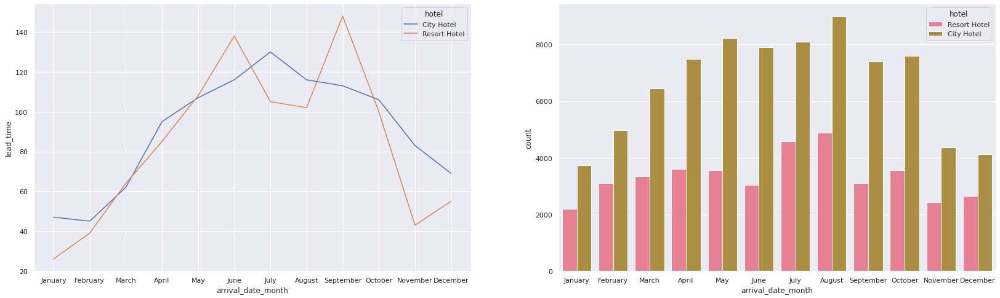

In [ ]:
# set lables
fig, axes = plt.subplots(1,2, figsize=(28, 8))

sns.lineplot(ax=axes[0], data=new_df_lead, x=new_df_lead['arrival_date_month'], y=new_df_lead['lead_time'],hue=new_df_lead['hotel'])
sns.set_palette("husl")
sns.countplot(ax=axes[1], data=new_df, x='arrival_date_month',hue='hotel')
sns.countplot(ax=axes[1], x=new_df_lead['arrival_date_month'].value_counts().index,hue=new_df_lead['hotel'])

Text(0, 0.5, 'Reservation Count')

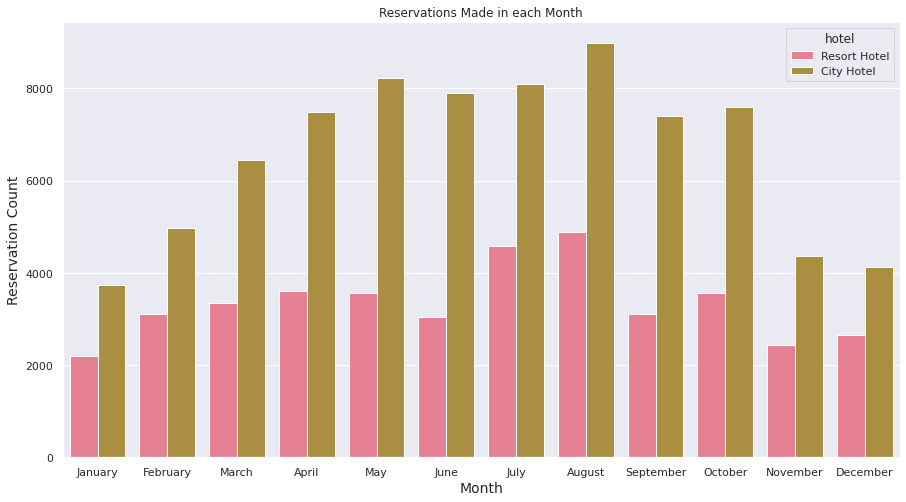

In [ ]:
# This graph shows the reservations made in each month for different hotel types.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("husl")
graph = sns.countplot(x = 'arrival_date_month',hue='hotel', data=new_df)
graph.set(title='Reservations Made in each Month')
graph.set_xlabel('Month',fontsize = 14)
graph.set_ylabel('Reservation Count',fontsize = 14)

Text(0, 0.5, 'Reservation Count')

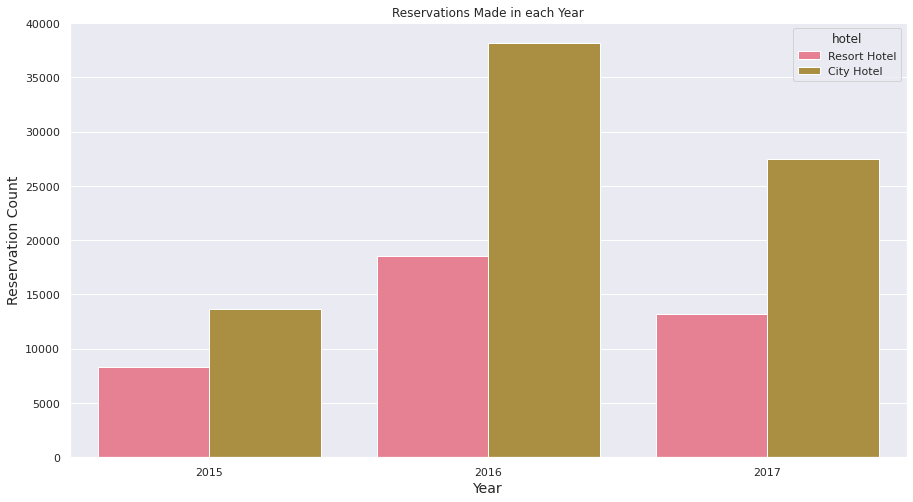

In [ ]:
# This graph shows the reservations made in each month for different hotel types.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("husl")
graph = sns.countplot(x = 'arrival_date_year',hue='hotel', data=new_df)
graph.set(title='Reservations Made in each Year')
graph.set_xlabel('Year',fontsize = 14)
graph.set_ylabel('Reservation Count',fontsize = 14)

In [ ]:
new_df['total_stays']= new_df['stays_in_weekend_nights']+new_df['stays_in_week_nights']

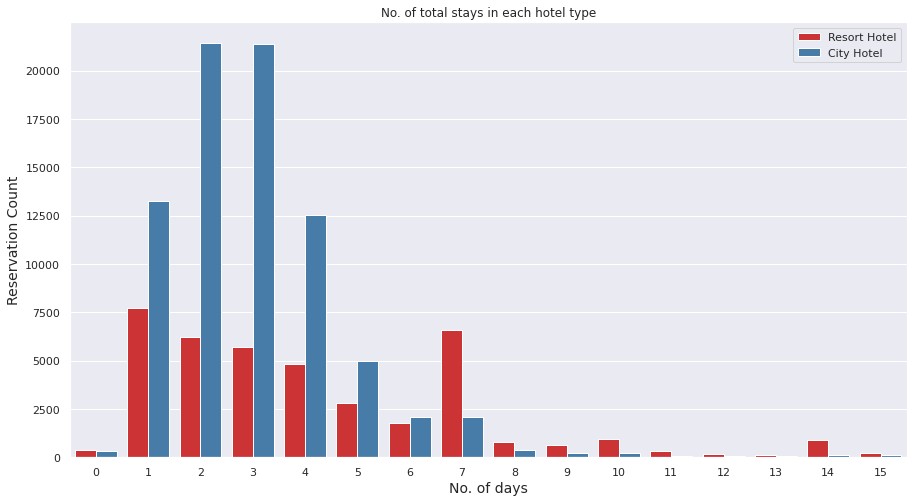

In [ ]:
# This graph shows No. of total stays in each hotel type.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(x = 'total_stays',hue='hotel', data=new_df)
graph.set(title='No. of total stays in each hotel type')
graph.set_xlabel('No. of days',fontsize = 14)
graph.set_ylabel('Reservation Count',fontsize = 14)
plt.legend(loc='upper right')

In [ ]:
new_df['guest']= new_df['adults']+new_df['children']+new_df['babies']
new_df['guest'] = new_df.guest.map( lambda x: 'Single' if x == 1 else 'Family')

In [ ]:
new_df.drop(new_df[new_df['adults'] == 0].index, inplace = True)
new_df[['adults']].value_counts()

adults
2         89680
1         23027
3          6202
4            78
dtype: int64

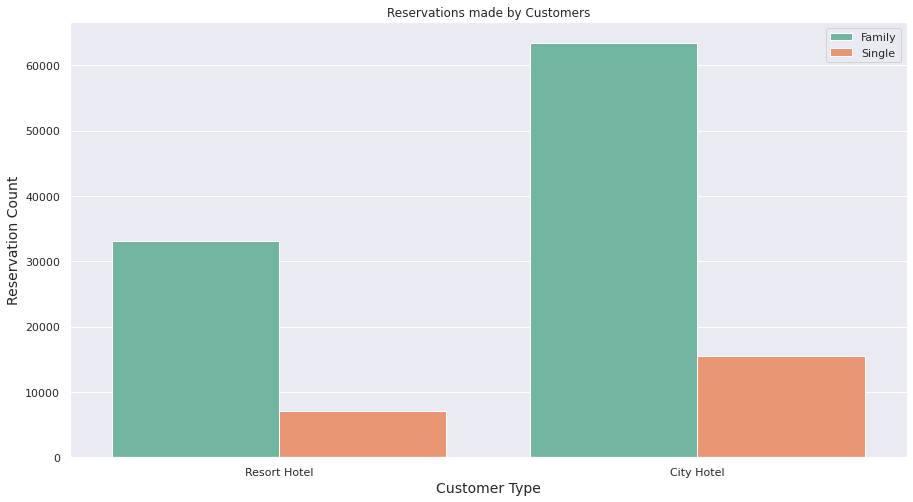

In [ ]:
# This graph shows Reservations made by Customers
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(x ='hotel',hue='guest', data=new_df)
graph.set(title='Reservations made by Customers')
graph.set_xlabel('Customer Type',fontsize = 14)
graph.set_ylabel('Reservation Count',fontsize = 14)
plt.legend(loc='upper right')

In [ ]:
# Top 10 countries with highest count of hotel.
top10_country = df[['hotel','country']].value_counts().head(10).reset_index().rename(columns={0:'count'})
top10_country

,hotel,country,count
0,City Hotel,PRT,30984
1,Resort Hotel,PRT,18094
2,City Hotel,FRA,8804
3,Resort Hotel,GBR,6814
4,City Hotel,DEU,6084
5,City Hotel,GBR,5315
6,City Hotel,ESP,4611
7,Resort Hotel,ESP,3957
8,City Hotel,ITA,3307
9,Resort Hotel,IRL,2166


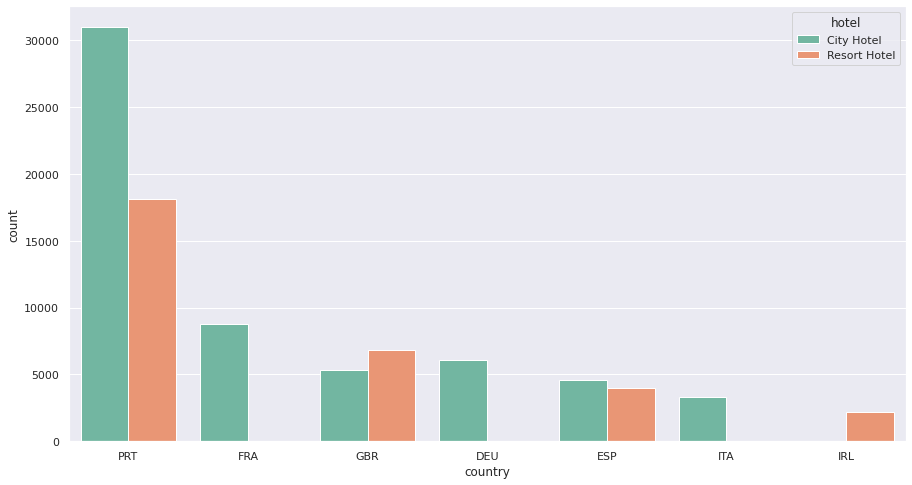

In [ ]:
# set plot size and plot the line
sns.barplot(x=top10_country['country'],y=top10_country['count'],hue=top10_country['hotel'])

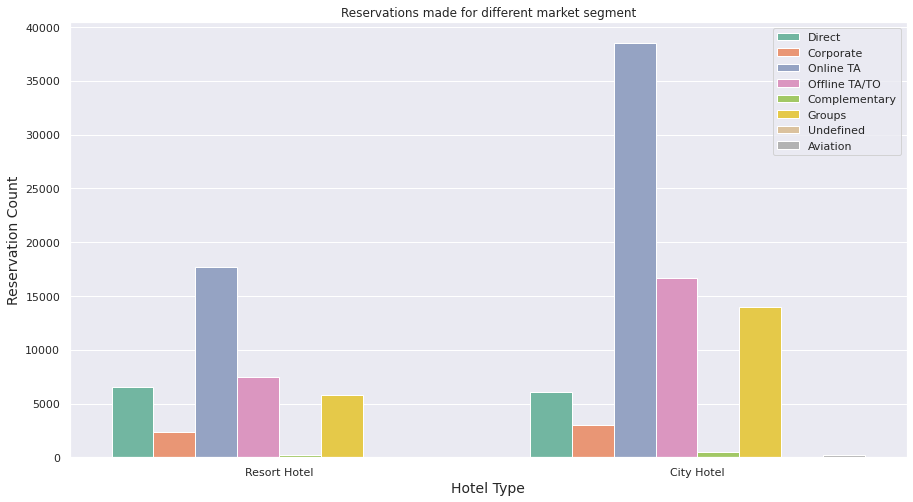

In [ ]:
# This graph shows Reservations made for different market segment
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(x ='hotel',hue='market_segment', data=new_df)
graph.set(title='Reservations made for different market segment')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Reservation Count',fontsize = 14)
plt.legend(loc='upper right')

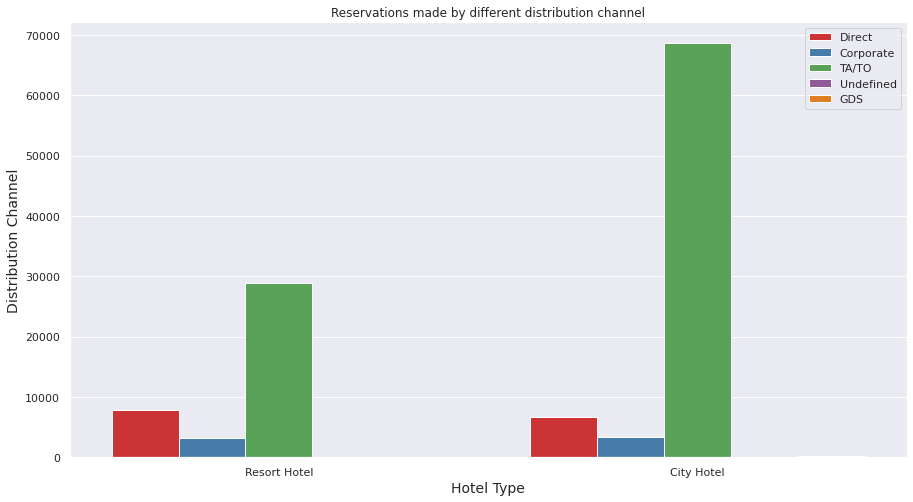

In [ ]:
# This graph shows reservations made by different distribution channel.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(x ='hotel',hue='distribution_channel', data=new_df)
graph.set(title='Reservations made by different distribution channel')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Distribution Channel',fontsize = 14)
plt.legend(loc='upper right')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


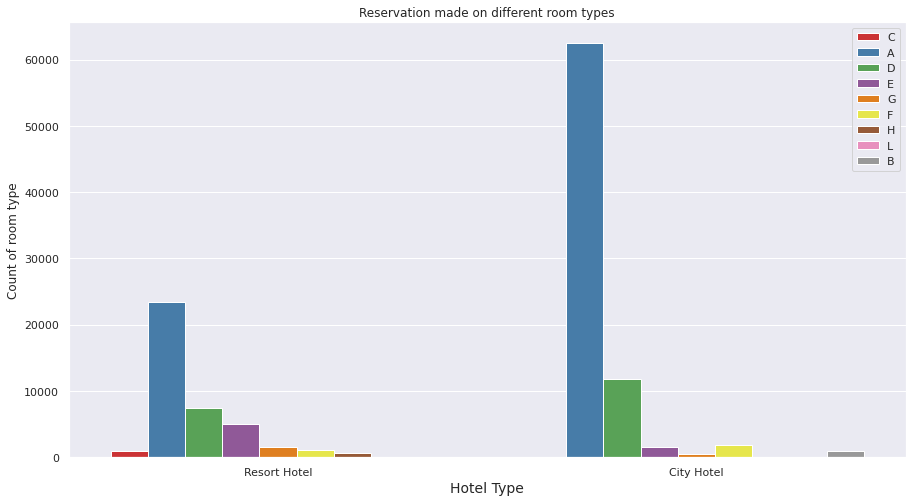

In [ ]:
# The graph shows reservation made on different room types
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df['hotel'],hue=new_df['reserved_room_type'])
graph.set(title='Reservation made on different room types')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Count of room type')
plt.legend(loc='upper right')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


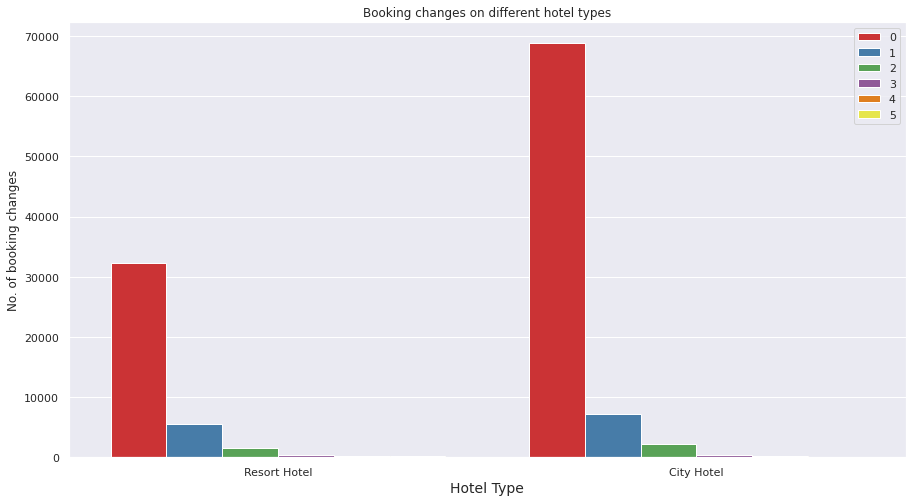

In [ ]:
# This graph shows Booking changes on different hotel types
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df['hotel'],hue=new_df['booking_changes'])
graph.set(title='Booking changes on different hotel types')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('No. of booking changes')
plt.legend(loc='upper right')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


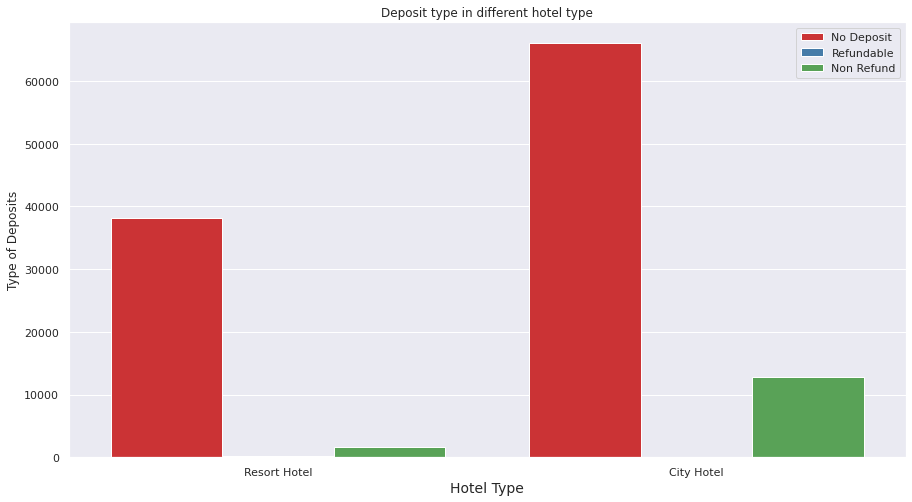

In [ ]:
# This graph shows Deposit type in different hotel type.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df['hotel'],hue=new_df['deposit_type'])
graph.set(title='Deposit type in different hotel type')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Type of Deposits')
plt.legend(loc='upper right')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


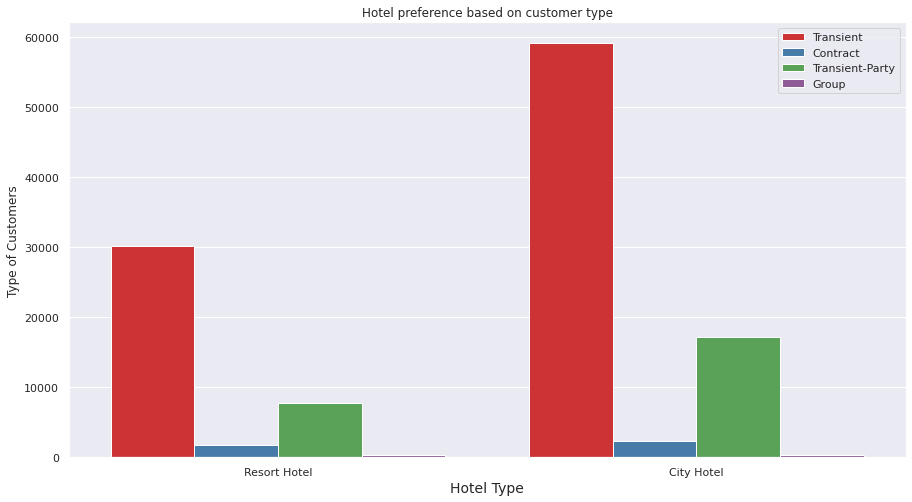

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df['hotel'],hue=new_df['customer_type'])
graph.set(title='Hotel preference based on customer type')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Type of Customers')
plt.legend(loc='upper right')

No handles with labels found to put in legend.


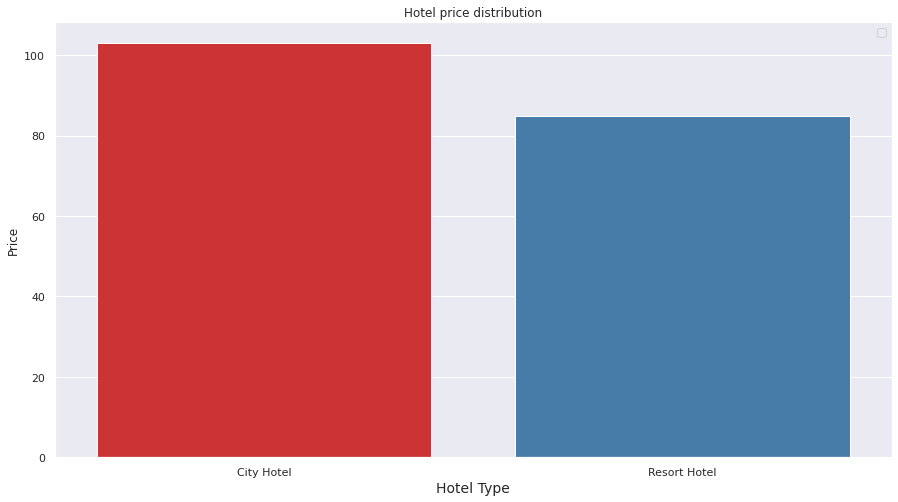

In [ ]:
hotel_price = new_df.groupby('hotel')['adr'].mean().astype(int).reset_index()

sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.barplot(x='hotel',y='adr', data=hotel_price)
graph.set(title='Hotel price distribution')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Price')
plt.legend(loc='upper right')

## **Cancellations in different Hotel Type**

Text(0, 0.5, 'Cancellation')

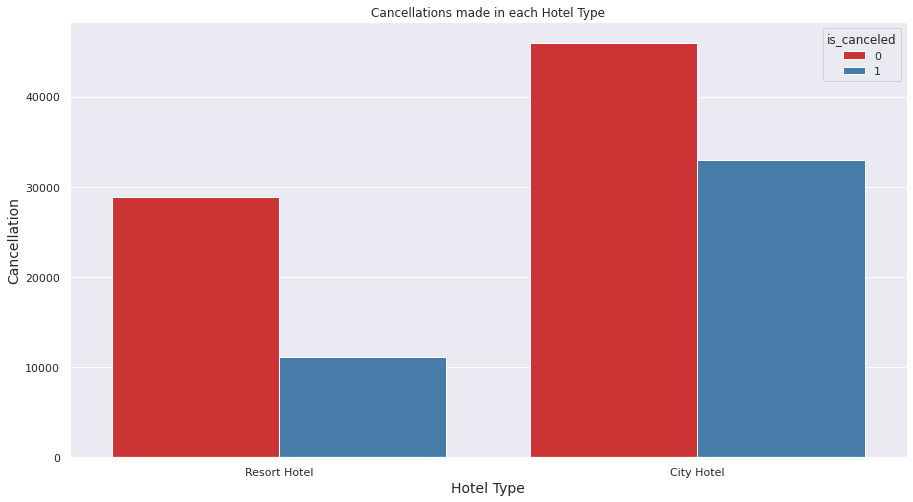

In [ ]:
# This graph shows cancellations made in different hotel types.
graph = sns.countplot(x = new_df['hotel'],hue=new_df['is_canceled'])
sns.set(rc={'figure.figsize':(8,8)})
sns.set_palette("Spectral")
graph.set(title='Cancellations made in each Hotel Type')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

No handles with labels found to put in legend.


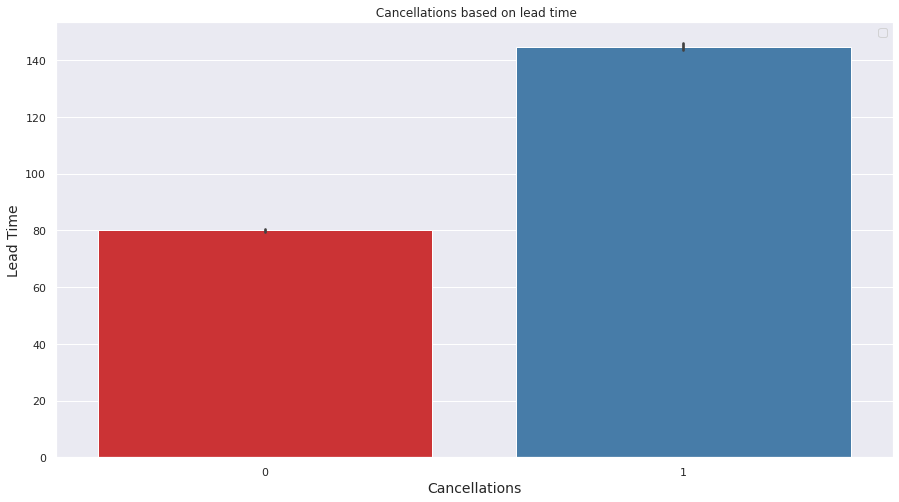

In [ ]:
# This graph shows Cancellations based on lead time
# df_lead=df.groupby('is_canceled')['lead_time'].mean().astype(int)
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.barplot(x=df['is_canceled'], y=df["lead_time"], data=df)
graph.set(title=' Cancellations based on lead time')
graph.set_xlabel('Cancellations',fontsize = 14)
graph.set_ylabel('Lead Time',fontsize = 14)
plt.legend(loc='upper right')

Text(0, 0.5, 'Cancellation')

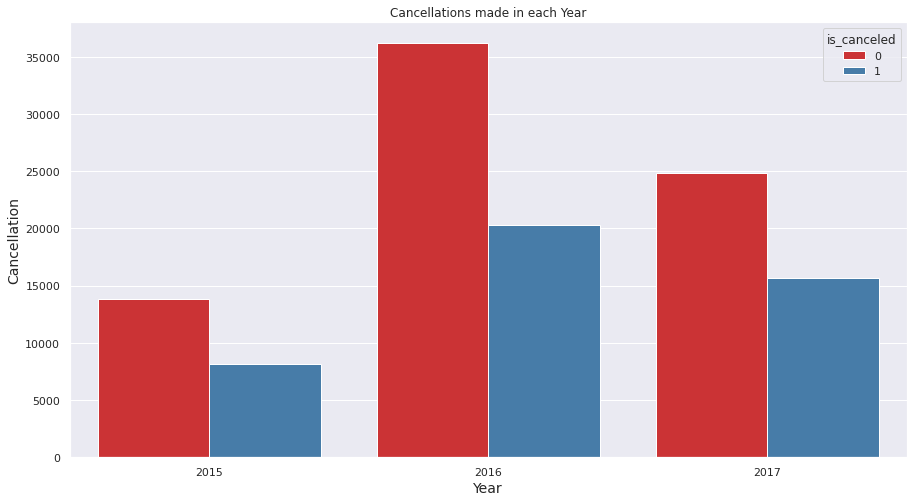

In [ ]:
graph = sns.countplot(x = new_df['arrival_date_year'],hue=new_df['is_canceled'])
sns.set(rc={'figure.figsize':(8,8)})
sns.set_palette("Spectral")
graph.set(title='Cancellations made in each Year')
graph.set_xlabel('Year',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

Text(0, 0.5, 'Cancellation')

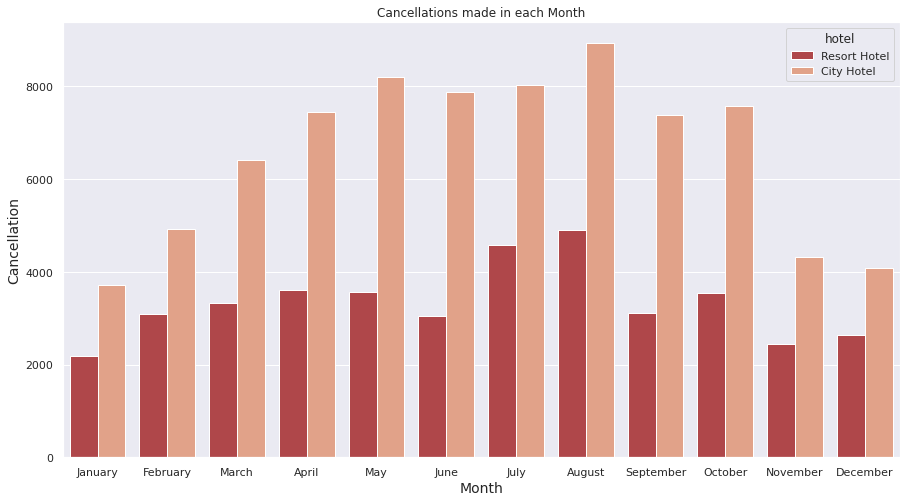

In [ ]:
# This graph shows cancellations made in each month
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("RdGy")
graph = sns.countplot(x = 'arrival_date_month',hue='hotel', data=new_df)
graph.set(title='Cancellations made in each Month')
graph.set_xlabel('Month',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

In [ ]:
new_df['kids_count'] = new_df.kids.map( lambda x: 'no_kids' if x == 0 else 'kids')
new_df['kids_count']

0         no_kids
1         no_kids
2         no_kids
3         no_kids
4         no_kids
           ...   
119385    no_kids
119386    no_kids
119387    no_kids
119388    no_kids
119389    no_kids
Name: kids_count, Length: 118987, dtype: object

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Cancellation')

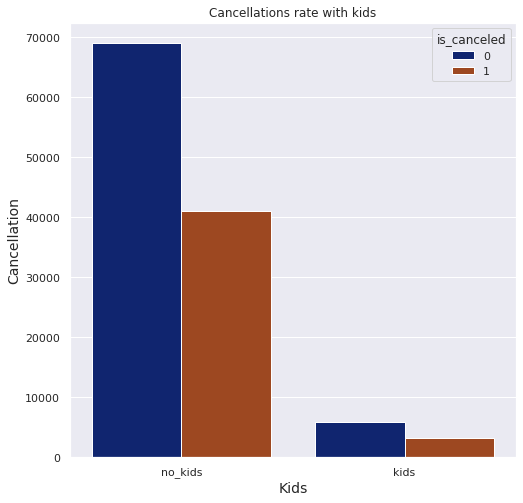

In [ ]:
# This graph shows how many cancellations were done due to kids/no kids
sns.set(rc={'figure.figsize':(8,8)})
sns.set_palette("dark")
graph = sns.countplot(new_df['kids_count'],hue=new_df['is_canceled'])
graph.set(title='Cancellations rate with kids')
graph.set_xlabel('Kids',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

cancellation rate is less in people with kids

Text(0, 0.5, 'Cancellation')

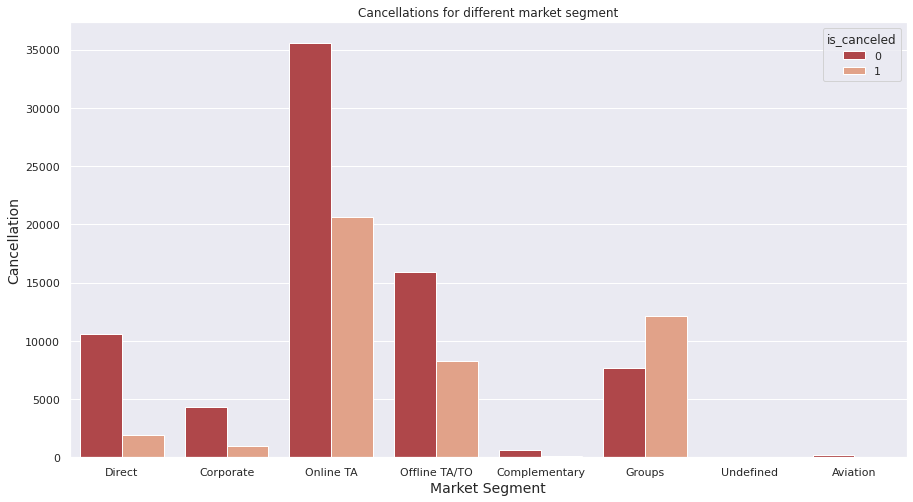

In [ ]:
# The graph shows cancellations for different market segment
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("RdGy")
graph = sns.countplot(x = 'market_segment',hue='is_canceled', data=new_df)
graph.set(title='Cancellations for different market segment')
graph.set_xlabel('Market Segment',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

Text(0, 0.5, 'Cancellation')

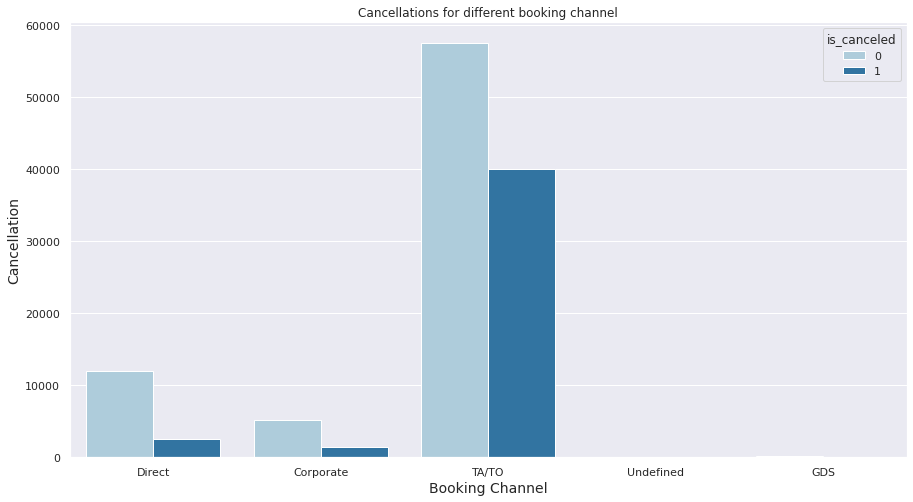

In [ ]:
# The graph shows cancellations for different distribution channel
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Paired")
graph = sns.countplot(x = 'distribution_channel',hue='is_canceled', data=new_df)
graph.set(title='Cancellations for different booking channel')
graph.set_xlabel('Booking Channel',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

In [ ]:
new_df['booking_status'] = new_df['reserved_room_type']!=new_df['assigned_room_type']
new_df['booking_status'] = new_df.booking_status.map( lambda x: 'changed' if x == False else 'Not changed')
new_df['booking_status']

0             changed
1             changed
2         Not changed
3             changed
4             changed
             ...     
119385        changed
119386        changed
119387        changed
119388        changed
119389        changed
Name: booking_status, Length: 118987, dtype: object

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


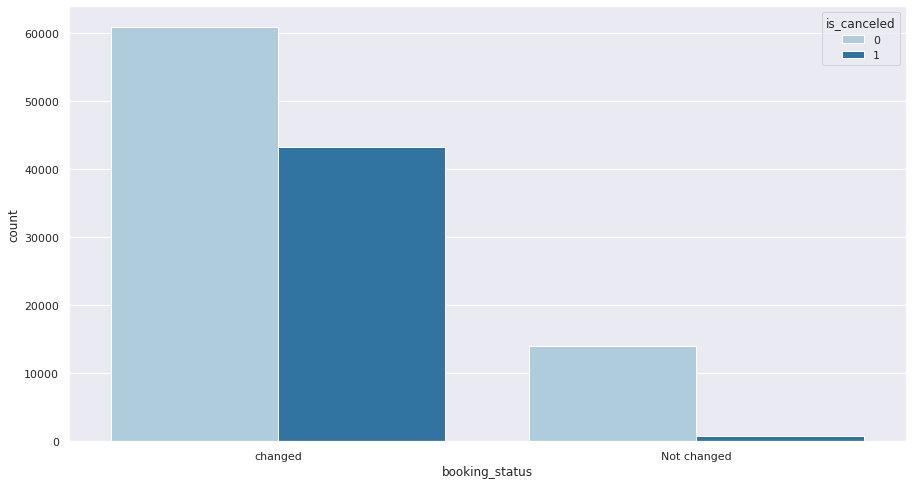

In [ ]:
sns.countplot(new_df['booking_status'],hue=new_df['is_canceled'])

In [ ]:
new_df[['total_stays','is_canceled','adr']].head(10)

,total_stays,is_canceled,adr
0,0,0,0.0
1,0,0,0.0
2,1,0,75.0
3,1,0,75.0
4,2,0,98.0
5,2,0,98.0
6,2,0,107.0
7,2,0,103.0
8,3,1,82.0
9,3,1,105.5


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Cancellation')

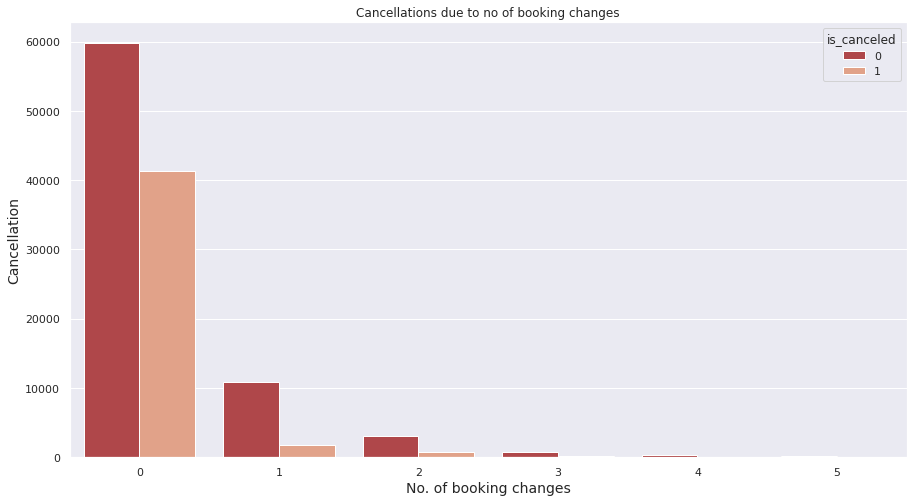

In [ ]:
# This graph shows cancellations due to no of booking changes.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("RdGy")
graph = sns.countplot(new_df["booking_changes"], hue=new_df["is_canceled"], data=new_df)
graph.set(title='Cancellations due to no of booking changes')
graph.set_xlabel('No. of booking changes',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

Text(0, 0.5, 'Cancellation')

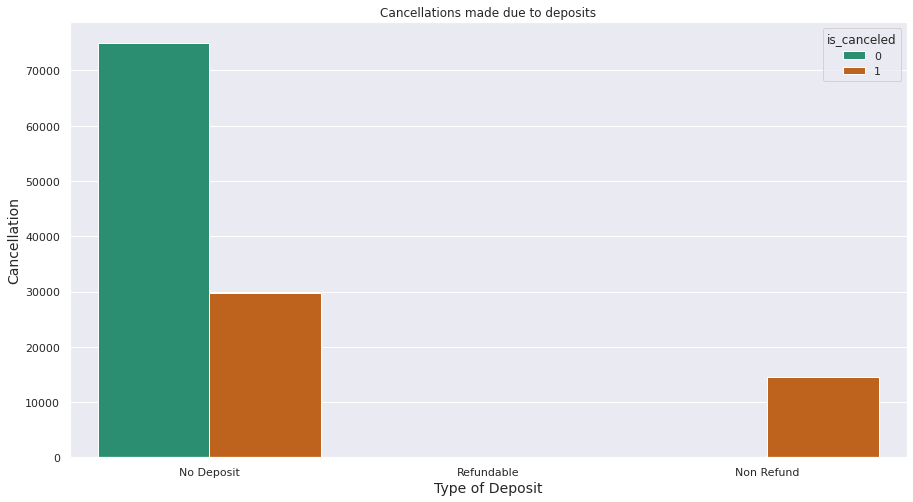

In [ ]:
# This graph shows cancellations made due to deposits.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Dark2")
graph = sns.countplot(x = 'deposit_type',hue='is_canceled', data=df)
graph.set(title='Cancellations made due to deposits')
graph.set_xlabel('Type of Deposit',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

Cancellations based on waiting time--no analysis

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Cancellation')

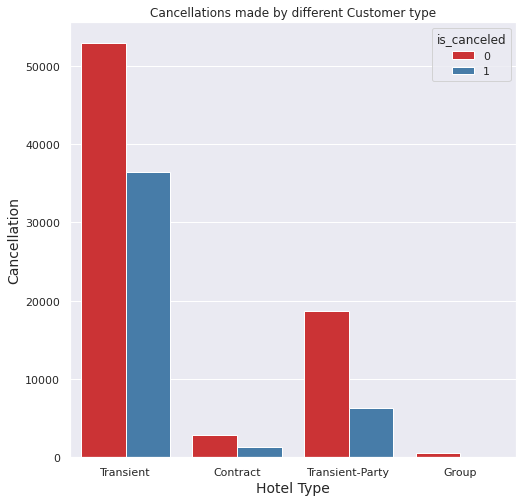

In [ ]:
# This graph shows the cancellation made by differnt customer type.
sns.set(rc={'figure.figsize':(8,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df['customer_type'],hue=new_df['is_canceled'])
graph.set(title='Cancellations made by different Customer type')
graph.set_xlabel('Hotel Type',fontsize = 14)
graph.set_ylabel('Cancellation',fontsize = 14)

No handles with labels found to put in legend.


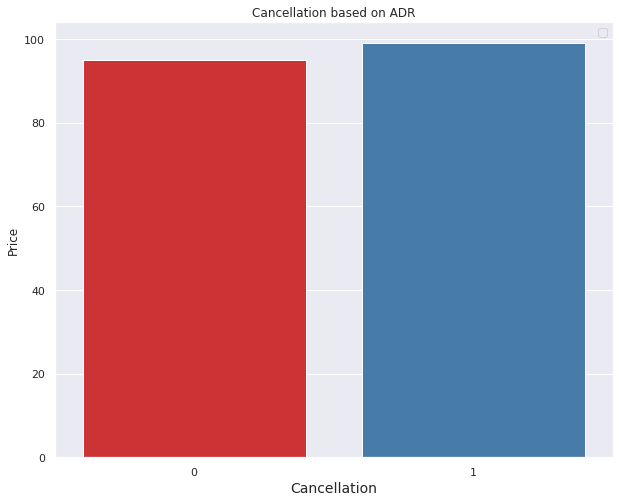

In [ ]:
# This graph shows cancellation based on ADR
hotel_price = new_df.groupby('is_canceled')['adr'].mean().astype(int).reset_index()

sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set1")
graph = sns.barplot(x='is_canceled',y='adr', data=hotel_price)
graph.set(title='Cancellation based on ADR')
graph.set_xlabel('Cancellation',fontsize = 14)
graph.set_ylabel('Price')
plt.legend(loc='upper right')

##**Analysis based on Stays**

In [ ]:
new_df['total_stays']= new_df['stays_in_weekend_nights']+ new_df['stays_in_week_nights']

Text(0, 0.5, 'No of People')

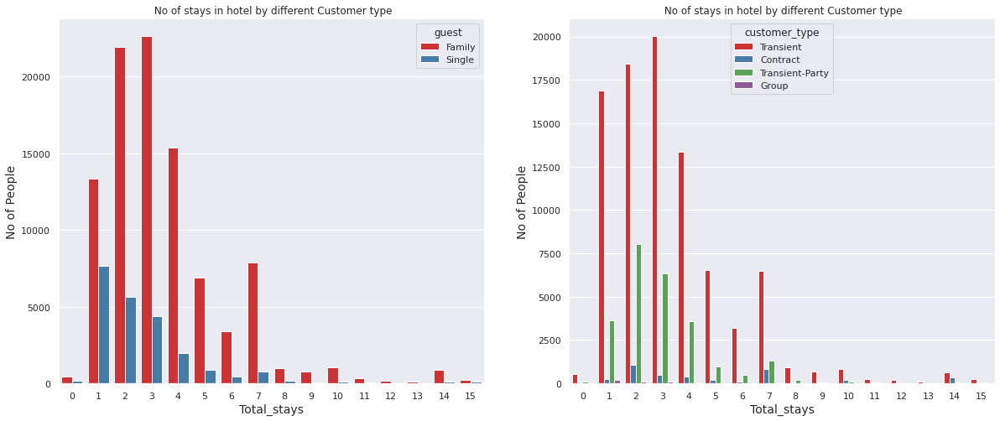

In [ ]:
# set lables
fig, axes = plt.subplots(1,2, figsize=(20, 8))

# This graph shows No of stays in hotel by different Customer type.
graph= sns.countplot(ax=axes[0],x='total_stays',hue='guest',data=new_df)
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph.set(title=' No of stays in hotel by different Customer type')
graph.set_xlabel('Total_stays',fontsize = 14)
graph.set_ylabel('No of People',fontsize = 14)

# This graph shows No of stays in hotel by different Customer type.
graph= sns.countplot(ax=axes[1],x='total_stays',hue='customer_type',data=new_df)
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph.set(title=' No of stays in hotel by different Customer type')
graph.set_xlabel('Total_stays',fontsize = 14)
graph.set_ylabel('No of People',fontsize = 14)

Optimal stay for families is less than 4 days and Transient people prefer to stay upto 4 days

In [ ]:
new_df[['total_stays','is_canceled','adr']].head(10)

,total_stays,is_canceled,adr
0,0,0,0.0
1,0,0,0.0
2,1,0,75.0
3,1,0,75.0
4,2,0,98.0
5,2,0,98.0
6,2,0,107.0
7,2,0,103.0
8,3,1,82.0
9,3,1,105.5


In [ ]:
bookings_by_country=new_df.groupby(['country','hotel'])['total_stays'].mean().astype(int).reset_index().head(10)
bookings_by_country= bookings_by_country.sort_values(by='total_stays',ascending=False)

In [ ]:
price_by_country=new_df.groupby(['country','hotel'])['adr'].mean().astype(int).reset_index().head(10)
price_by_country= price_by_country.sort_values(by='adr',ascending=True)

Text(0, 0.5, 'Price')

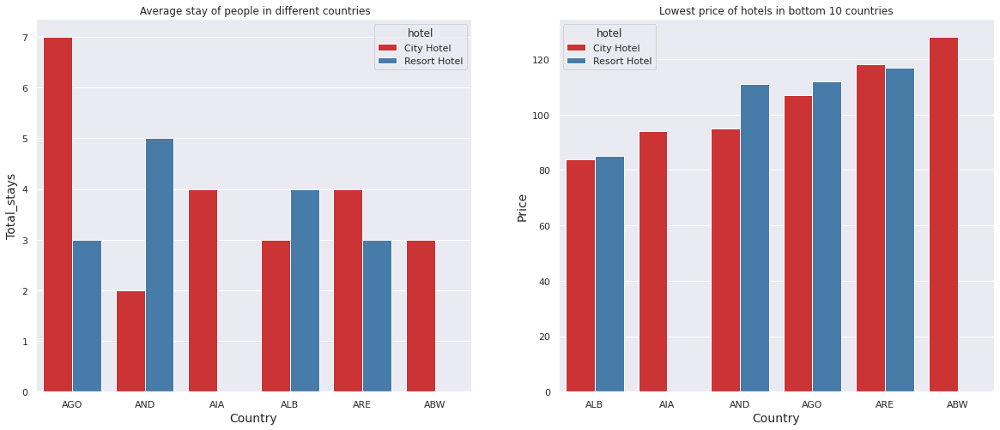

In [ ]:
# set lables
fig, axes = plt.subplots(1,2, figsize=(20, 8))

# This graph shows Average stay of people in different countries.
graph = sns.barplot(ax=axes[0], x='country',y='total_stays', hue='hotel',data=bookings_by_country)
sns.set_palette("Set1")
graph.set(title=' Average stay of people in different countries')
graph.set_xlabel('Country',fontsize = 14)
graph.set_ylabel('Total_stays',fontsize = 14)

# This graph shows price of hotels in different countries.
graph = sns.barplot(ax=axes[1],x='country',y='adr', hue='hotel',data=price_by_country)
sns.set_palette("Set2")
graph.set(title='Lowest price of hotels in bottom 10 countries')
graph.set_xlabel('Country',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

People prefer to go for those hotels which have lesser price.


In [ ]:
room_type=new_df.groupby(['assigned_room_type','hotel'])['total_stays'].mean().astype(int).reset_index().head(10)
room_type= room_type.sort_values(by='total_stays',ascending=False)
room_type

,assigned_room_type,hotel,total_stays
1,A,Resort Hotel,4
5,C,Resort Hotel,4
7,D,Resort Hotel,4
9,E,Resort Hotel,4
3,B,Resort Hotel,3
6,D,City Hotel,3
8,E,City Hotel,3
0,A,City Hotel,2
2,B,City Hotel,2
4,C,City Hotel,2


In [ ]:
room_price=new_df.groupby(['assigned_room_type','hotel'])['adr'].mean().astype(int).reset_index().head(10)
room_price= room_price.sort_values(by='adr',ascending=True)

Text(0, 0.5, 'Price')

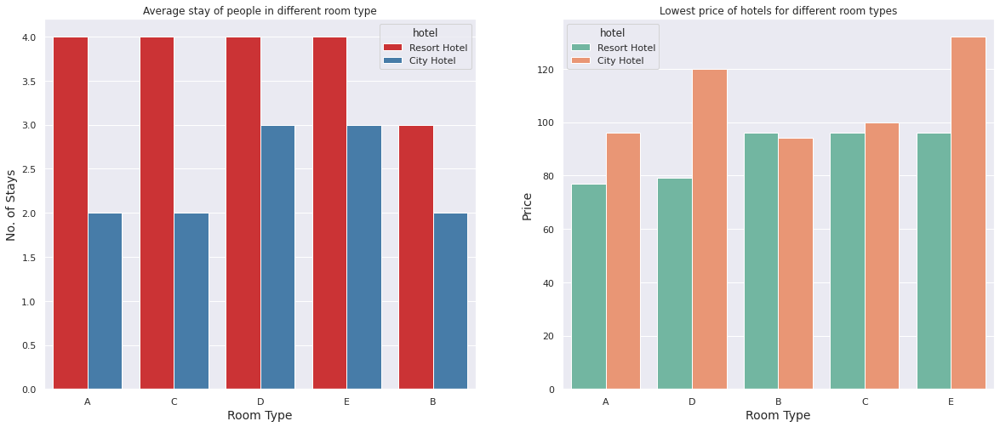

In [ ]:
# set lables
fig, axes = plt.subplots(1,2, figsize=(20, 8))

# This graph shows No of stays in different room type
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set1")
graph = sns.barplot(ax=axes[0], x='assigned_room_type',y='total_stays', hue= 'hotel', data=room_type)
graph.set(title='Average stay of people in different room type')
graph.set_xlabel('Room Type',fontsize = 14)
graph.set_ylabel('No. of Stays',fontsize = 14)

# This graph shows Lowest price of bottom 10 hotels in countries for different room types.
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set2")
graph = sns.barplot(ax=axes[1], x='assigned_room_type', y='adr', hue='hotel',data=room_price)
graph.set(title='Lowest price of hotels for different room types')
graph.set_xlabel('Room Type',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

People prefer Resort hotel more than City hotel for longer stay
City hotels with high ADR are more preffered for longer stay but, when it comes for Resort hotels, hotels with less ADR are more preferred.

##**Analysis based on Meal**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'No. of People')

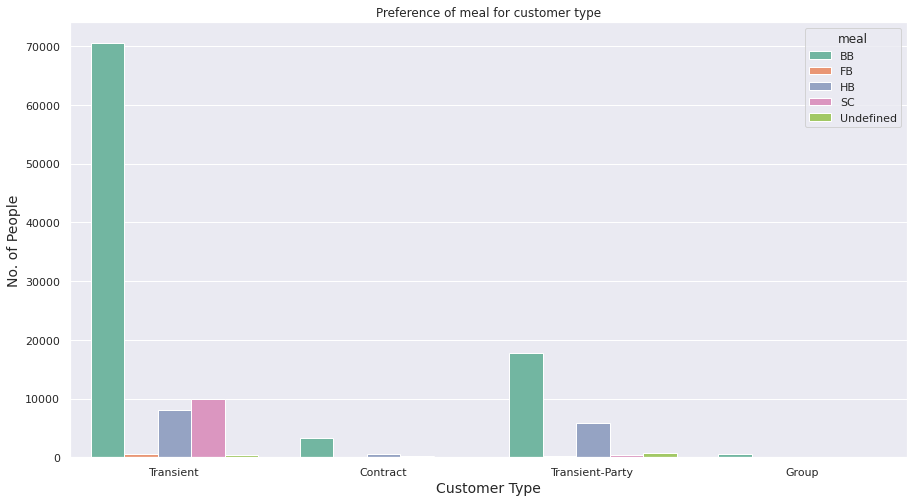

In [ ]:
# This graph shows Preference of meal for customer type
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(new_df["customer_type"], hue=new_df["meal"], data=new_df)
graph.set(title='Preference of meal for customer type')
graph.set_xlabel('Customer Type',fontsize = 14)
graph.set_ylabel('No. of People',fontsize = 14)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


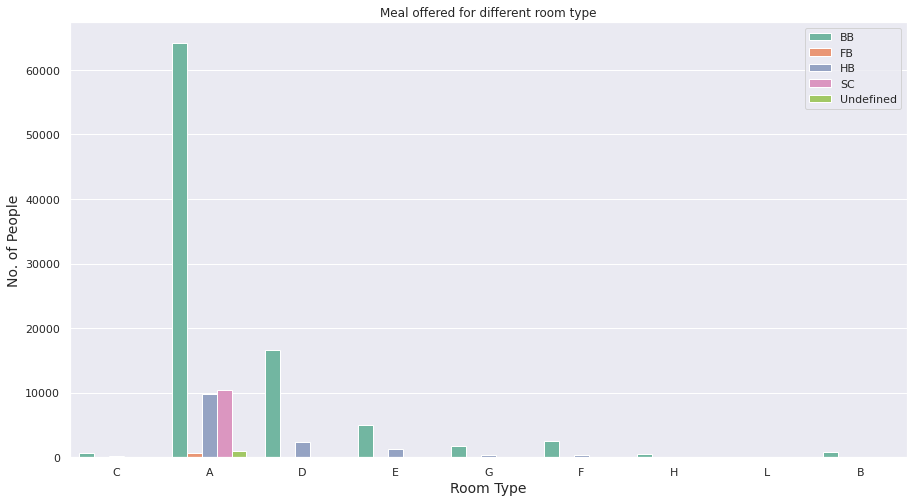

In [ ]:
# This graph shows Meal offered for different room type
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(new_df["reserved_room_type"], hue=new_df["meal"], data=new_df)
graph.set(title='Meal offered for different room type')
graph.set_xlabel('Room Type',fontsize = 14)
graph.set_ylabel('No. of People',fontsize = 14)
plt.legend(loc='upper right')

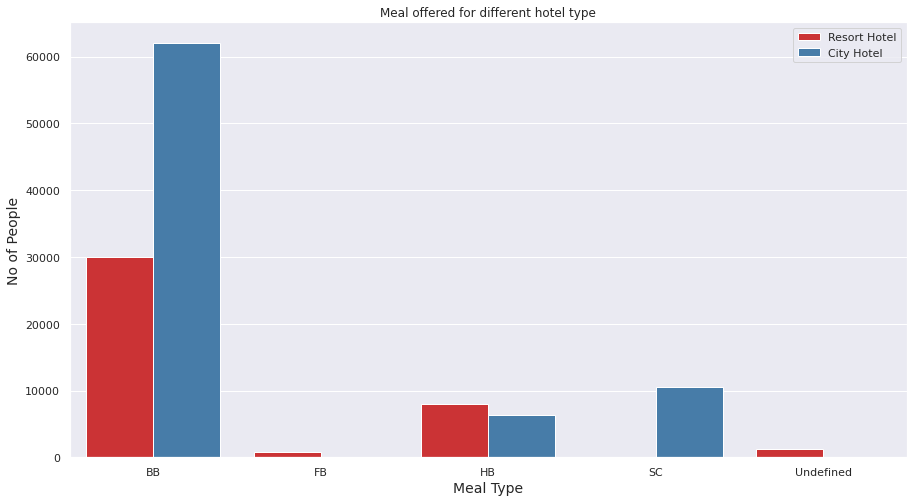

In [ ]:
# The graph shows Meal offered for different hotel type.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(x = 'meal',hue='hotel', data=new_df)
graph.set(title='Meal offered for different hotel type')
graph.set_xlabel('Meal Type',fontsize = 14)
graph.set_ylabel('No of People',fontsize = 14)
plt.legend(loc='upper right')

In [ ]:
meal_price=new_df.groupby(['meal','hotel'])['adr'].mean().astype(int).reset_index().head(10)
meal_price= meal_price.sort_values(by='adr',ascending=True)

In [ ]:
meal_market=new_df.groupby(['meal','customer_type'])['adr'].mean().astype(int).reset_index().head(10)
meal_market= meal_market.sort_values(by='adr',ascending=True)
meal_market.value_counts()

meal  customer_type    adr
BB    Contract         85     1
      Group            76     1
      Transient        99     1
      Transient-Party  81     1
FB    Contract         123    1
      Group            81     1
      Transient        96     1
      Transient-Party  81     1
HB    Contract         92     1
      Group            106    1
dtype: int64

Text(0, 0.5, 'Price')

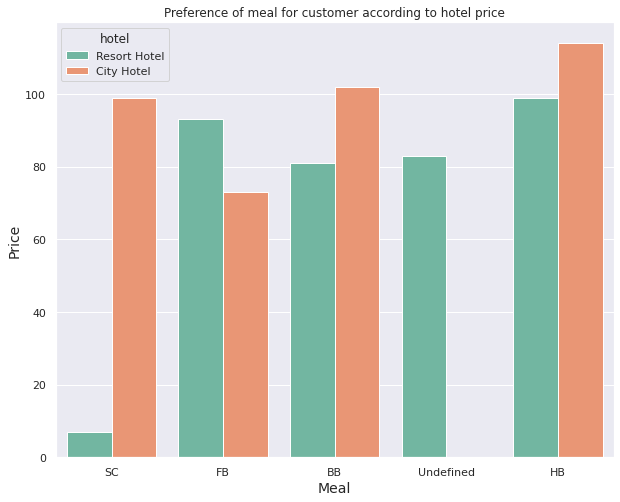

In [ ]:
# This graph shows Preference of meal for customer according to hotel price
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set2")
graph = sns.barplot(x='meal', y='adr', hue='hotel',data=meal_price)
graph.set(title='Preference of meal for customer according to hotel price')
graph.set_xlabel('Meal',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)


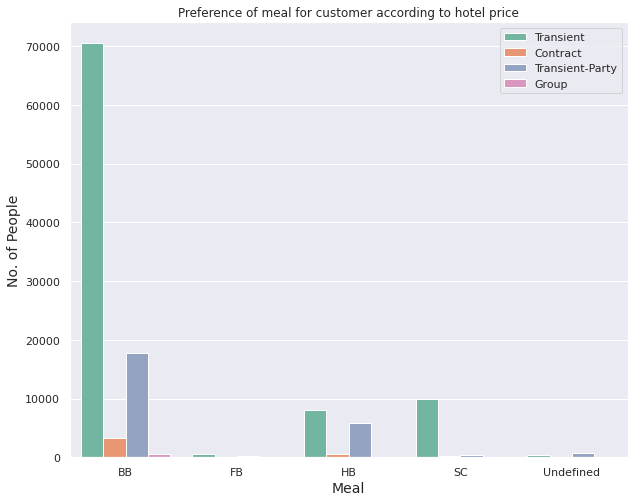

In [ ]:
# This graph shows Preference of meal for different market segment.
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set2")
graph = sns.countplot(x='meal', hue='customer_type',data=new_df)
graph.set(title='Preference of meal for customer according to hotel price')
graph.set_xlabel('Meal',fontsize = 14)
graph.set_ylabel('No. of People',fontsize = 14)
plt.legend(loc='upper right')

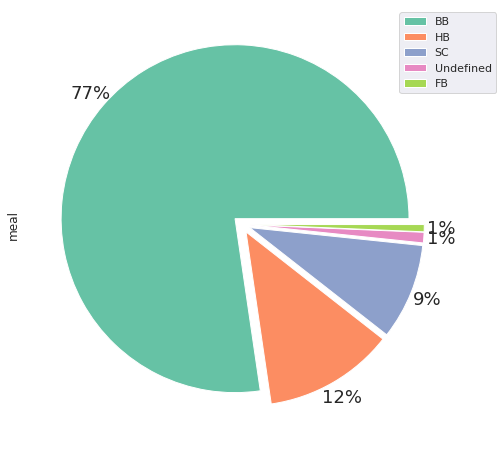

In [ ]:
df['meal'].value_counts().plot.pie(explode=[0.05]*5, autopct='%.0f%%', figsize=(10,8),fontsize=18,pctdistance=1.1,labeldistance=1.3,labels=None)
plt.legend(bbox_to_anchor=(0.85, 1), loc='upper left', labels=df['meal'].value_counts().index.tolist())

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


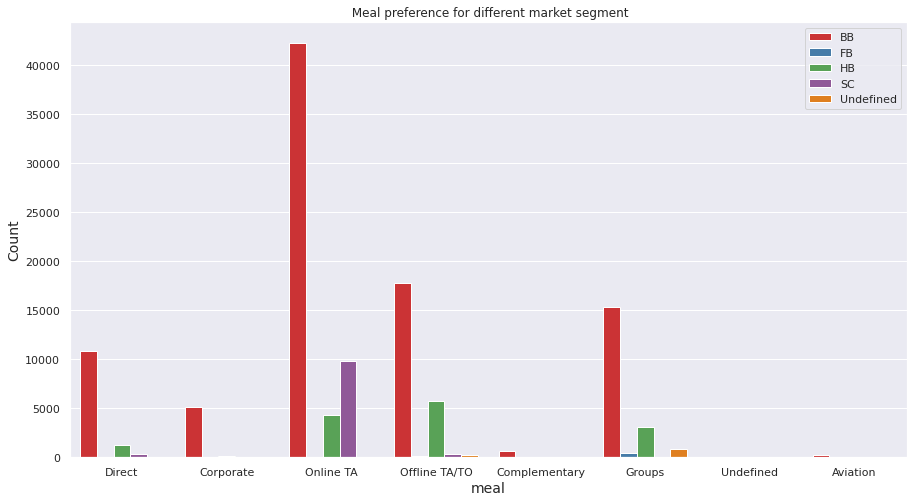

In [ ]:
# This graph shows meal preference for different market segment.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(df["market_segment"], hue=df["meal"], data=df)
graph.set(title=' Meal preference for different market segment')
graph.set_xlabel('meal',fontsize = 14)
graph.set_ylabel('Count',fontsize = 14)
plt.legend(loc='upper right')

##**Analysis based on Customer Type**

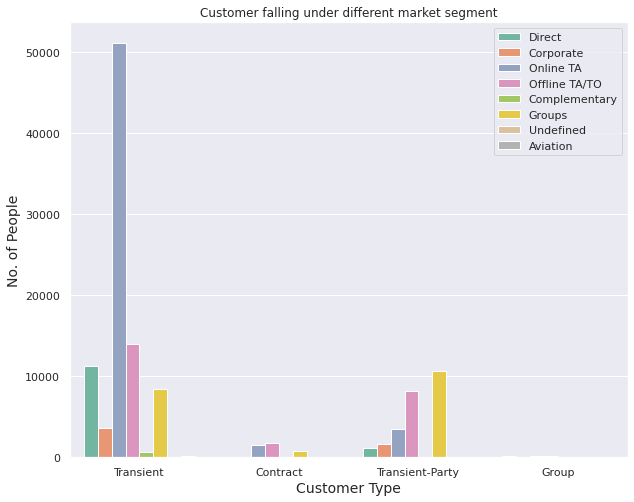

In [ ]:
# This graph shows Customer falling under different market segment.
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set2")
graph = sns.countplot(x='customer_type', hue='market_segment',data=new_df)
graph.set(title='Customer falling under different market segment')
graph.set_xlabel('Customer Type',fontsize = 14)
graph.set_ylabel('No. of People',fontsize = 14)
plt.legend(loc='upper right')

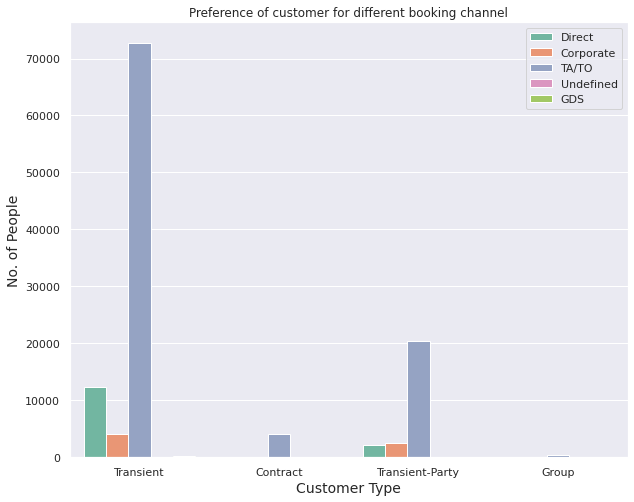

In [ ]:
# This graph shows Preference of customer for different distribution channel.
sns.set(rc={'figure.figsize':(10,8)})
sns.set_palette("Set2")
graph = sns.countplot(x='customer_type', hue='distribution_channel',data=new_df)
graph.set(title='Preference of customer for different booking channel')
graph.set_xlabel('Customer Type',fontsize = 14)
graph.set_ylabel('No. of People',fontsize = 14)
plt.legend(loc='upper right')

##**Analysis based on Hotel**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Text(0, 0.5, 'Count')

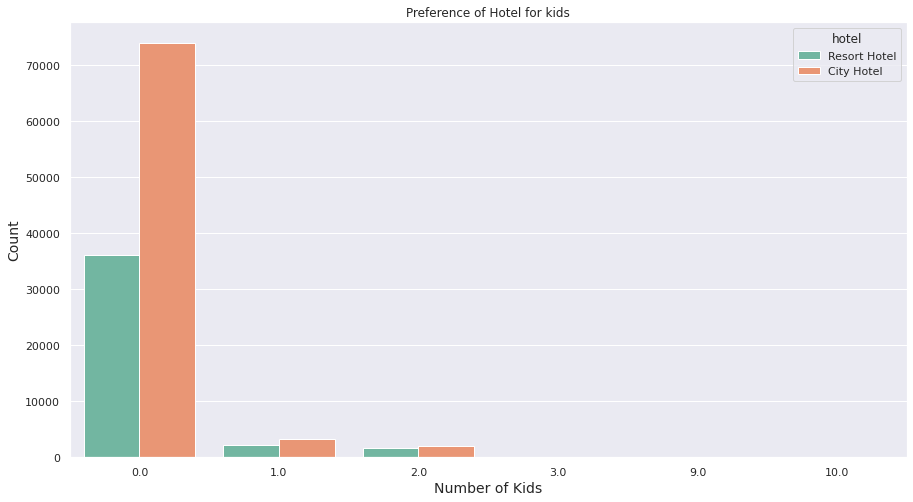

In [ ]:
# This graph shows customer preference for hotel types
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(df["kids"], hue=df["hotel"], data=df)
graph.set(title='Preference of Hotel for kids')
graph.set_xlabel('Number of Kids',fontsize = 14)
graph.set_ylabel('Count',fontsize = 14)

Which room type is in most demand and which room type generatest highest adr?

Most demanded room type is A, but better adr rooms are of type H, G and C also. Hotels should increase the no. of room types A and H to maximise revenue.

## **ADR Studies**

Text(0, 0.5, 'Price')

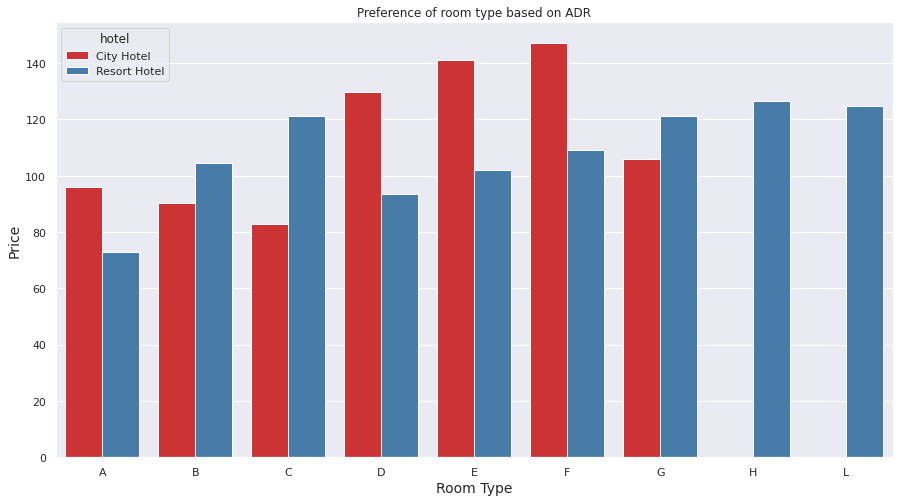

In [ ]:
# This graph shows Preference of room type based on ADR
df_room=new_df.groupby(['reserved_room_type','hotel'])['adr'].mean().reset_index()
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.barplot(x="reserved_room_type",y='adr', hue="hotel", data=df_room)
graph.set(title='Preference of room type based on ADR')
graph.set_xlabel('Room Type',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

Text(0, 0.5, 'Price')

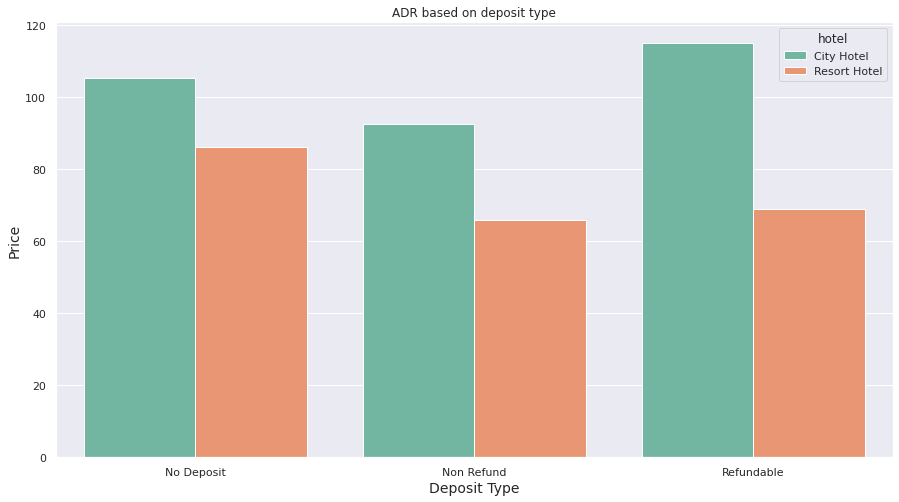

In [ ]:
# This graph shows ADR based on deposit type
df_deposit=new_df.groupby(['deposit_type','hotel'])['adr'].mean().reset_index()
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.barplot(x="deposit_type",y='adr', hue="hotel", data=df_deposit)
graph.set(title='ADR based on deposit type')
graph.set_xlabel('Deposit Type',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

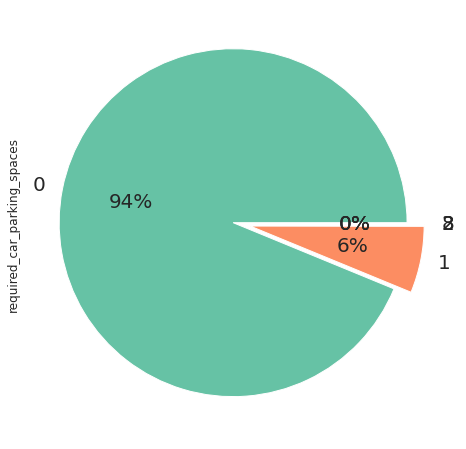

In [ ]:
# This graph shows distribution of car parking spaces in hotels.
df['required_car_parking_spaces'].value_counts().plot.pie(explode=[0.05]*5, autopct='%.0f%%', figsize=(10,8),fontsize=20)

In [ ]:
#groupby
bookings_by_months_df=new_df.groupby(['arrival_date_month','hotel'])['adr'].mean().reset_index()
#create month list
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
# it will take the order of the month list in the df along with values
bookings_by_months_df['arrival_date_month']=pd.Categorical(bookings_by_months_df['arrival_date_month'],categories=months,ordered=True)
#sorting
bookings_by_months_df=bookings_by_months_df.sort_values('arrival_date_month')
bookings_by_months_df

,arrival_date_month,hotel,adr
0,January,City Hotel,82.761686
1,January,Resort Hotel,49.507033
2,February,City Hotel,84.797226
3,February,Resort Hotel,55.189716
4,March,City Hotel,91.368753
5,March,Resort Hotel,57.556566
6,April,City Hotel,108.731498
7,April,Resort Hotel,77.505682
8,May,City Hotel,117.948622
9,May,Resort Hotel,78.448231


Text(0, 0.5, 'ADR')

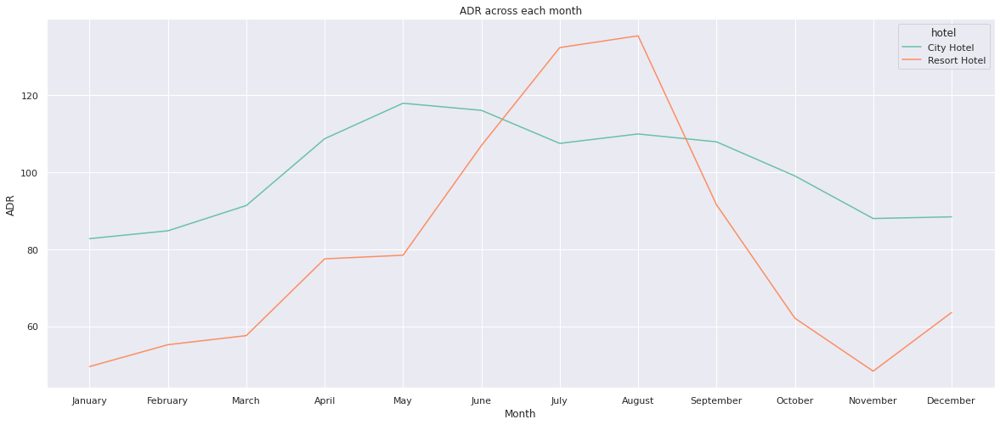

In [ ]:
# set plot size and plot the line
plt.figure(figsize=(20,8))
sns.lineplot(x=bookings_by_months_df['arrival_date_month'],y=bookings_by_months_df['adr'],hue=bookings_by_months_df['hotel'])

# set lables
plt.title('ADR across each month')
plt.xlabel('Month')
plt.ylabel('ADR')

Text(0.5, 1.0, 'ADR on each year')

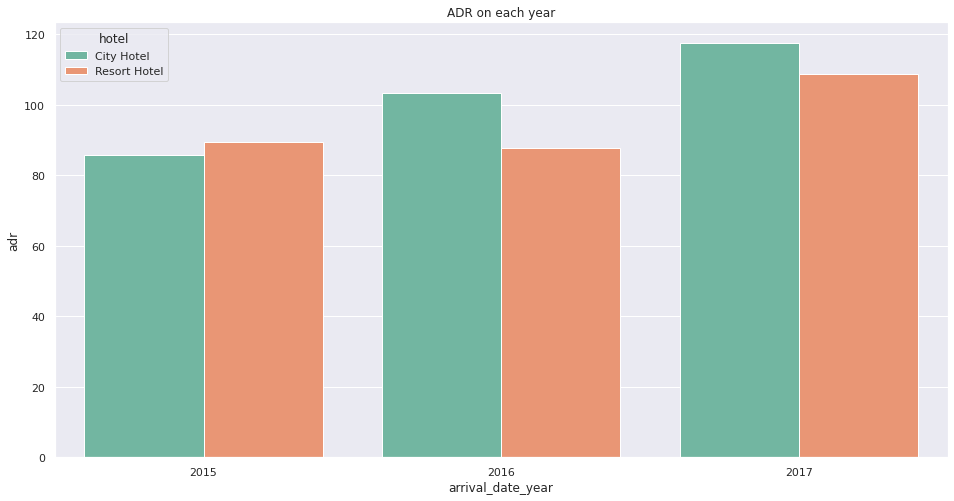

In [ ]:
# This graph shows ADR vs Each year.
df_year=df.groupby(['arrival_date_year','hotel'])['adr'].mean().reset_index()
# set plot size and plot barchart
plt.figure(figsize=(16,8))
sns.barplot(x='arrival_date_year', y='adr', data=df_year, hue='hotel')
plt.title('ADR on each year')

Text(0.5, 1.0, 'ADR based on Meal Type')

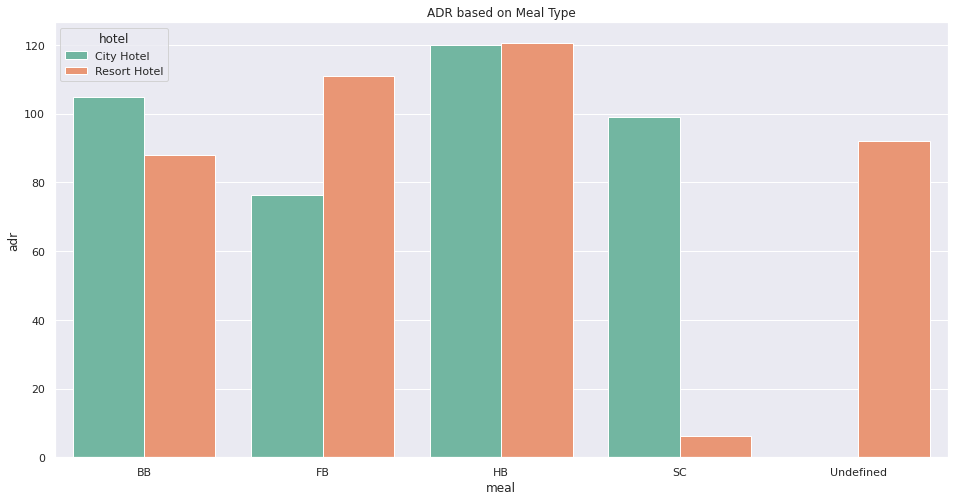

In [ ]:
# This graph shows ADR vs Meal Type.
df_year=df.groupby(['meal','hotel'])['adr'].mean().reset_index()
# set plot size and plot barchart
plt.figure(figsize=(16,8))
sns.barplot(x='meal', y='adr', data=df_year, hue='hotel')
plt.title('ADR based on Meal Type')

Text(0.5, 1.0, 'ADR across Distribution channel')

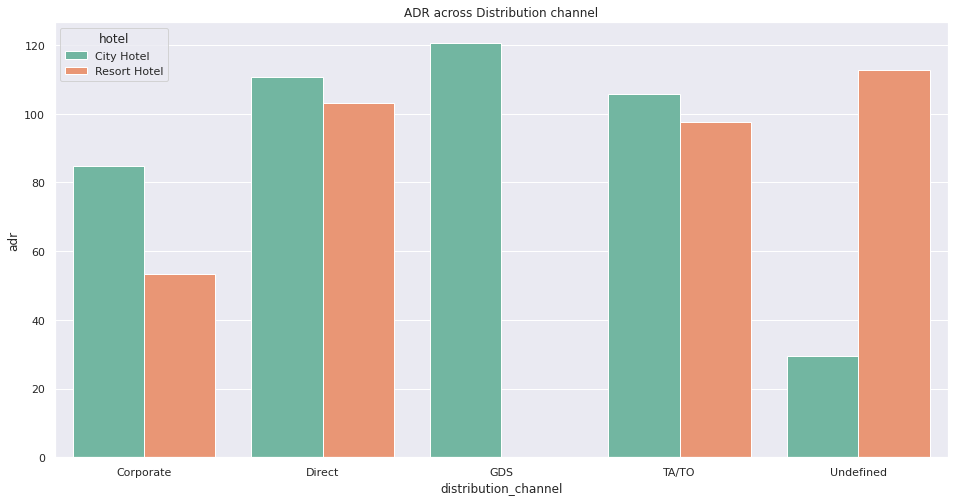

In [ ]:
#This graph shows ADR vs Distribution Channel.
df_weekend=df.groupby(['distribution_channel','hotel'])['adr'].mean().reset_index()
# set plot size and plot barchart
plt.figure(figsize=(16,8))
sns.barplot(x='distribution_channel', y='adr', data=df_weekend, hue='hotel')
plt.title('ADR across Distribution channel')

Text(0, 0.5, 'ADR')

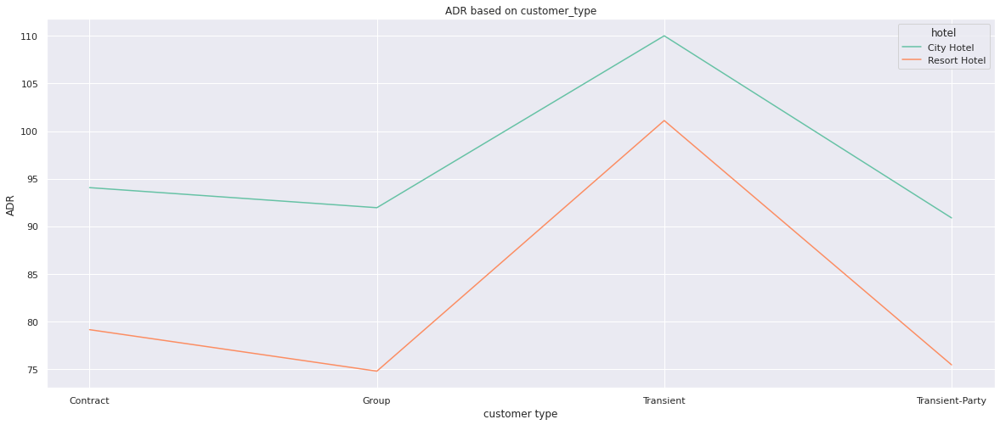

In [ ]:
# This graph shows ADR based on customer type
df_adr=df.groupby(['customer_type','hotel'])['adr'].mean().reset_index()
plt.figure(figsize=(20,8))
sns.lineplot(x=df_adr['customer_type'],y=df_adr['adr'],hue=df_adr['hotel'])
sns.set_palette("Set2")
# set lables
plt.title('ADR based on customer_type')
plt.xlabel('customer type')
plt.ylabel('ADR')

# **Analysis based on Country**

In [ ]:
import pandas as pd
import plotly.express as px
fig = px.choropleth(new_df, locations="country",
                    color="adr",
                    animation_frame="hotel",
                    title = "Fare of hotels in Different Country",
                    color_continuous_scale=px.colors.sequential.PuRd)
 
 
fig["layout"].pop("updatemenus")
fig.show()

In [ ]:
new_df['guest']=new_df['adults']+new_df['children']+new_df['babies']

In [ ]:
fig = px.choropleth(new_df, locations="country",
                    color="guest",
                    hover_name="arrival_date_year",
                    animation_frame="market_segment",
                    title = "Types of customers from different market segment",
                    color_continuous_scale=px.colors.sequential.PuRd)
 
 
fig["layout"].pop("updatemenus")
fig.show()

In [ ]:
fig = px.choropleth(new_df, locations="country",
                    color="total_stays",
                    hover_name="arrival_date_year",
                    animation_frame="customer_type",
                    title = "Preference of customers for different countries",
                    color_continuous_scale=px.colors.sequential.PuRd)
 
 
fig["layout"].pop("updatemenus")
fig.show()

Text(0, 0.5, 'Price')

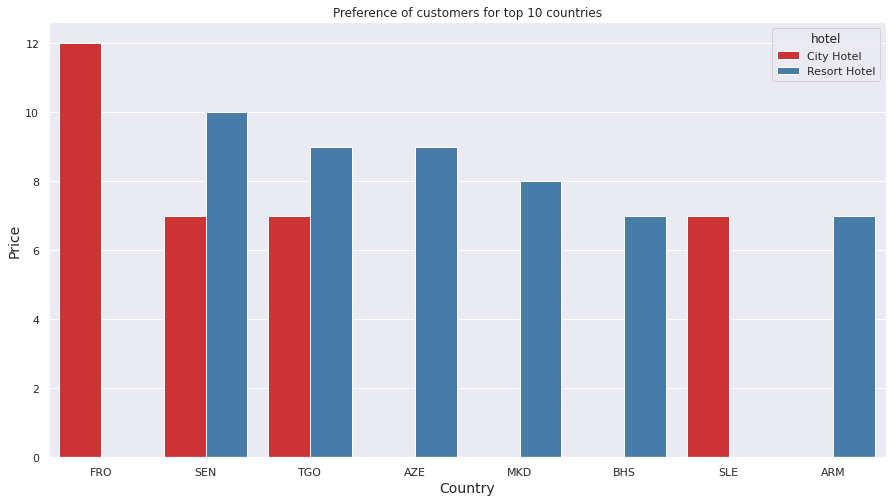

In [ ]:
# Top 10 countries customers prefer to stay.
preffered_stay = new_df.groupby(['country','hotel'])['total_stays'].mean().astype(int).reset_index().sort_values(by='total_stays',ascending=False).head(10)
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.barplot(x="country",y='total_stays', hue="hotel", data=preffered_stay)
graph.set(title='Preference of customers for top 10 countries')
graph.set_xlabel('Country',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

Text(0, 0.5, 'Price')

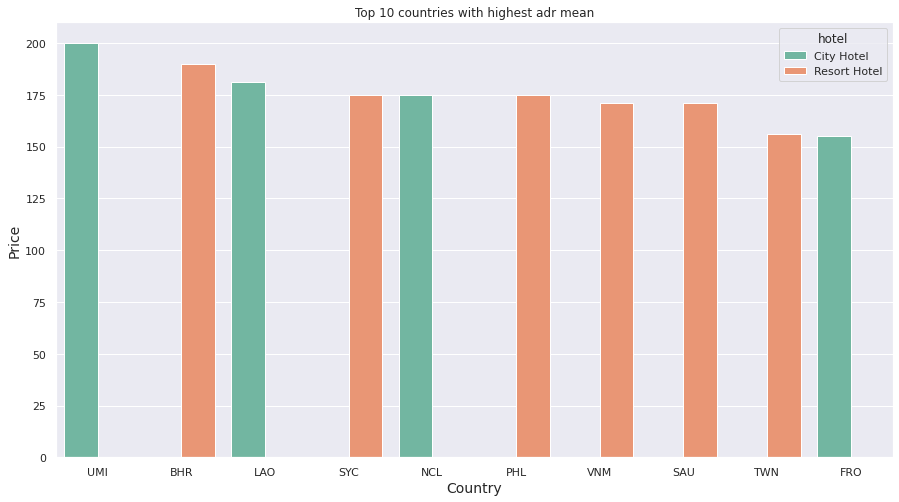

In [ ]:
# Finding Top 10 countries with highest adr mean.
country_adr = new_df.groupby(['country','hotel'])['adr'].mean().astype(int).reset_index().sort_values(by='adr',ascending=False).head(10)
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.barplot(x="country",y='adr', hue="hotel", data=country_adr)
graph.set(title='Top 10 countries with highest adr mean')
graph.set_xlabel('Country',fontsize = 14)
graph.set_ylabel('Price',fontsize = 14)

# **Analysis based on Bookings Changes**

Text(0, 0.5, 'Count')

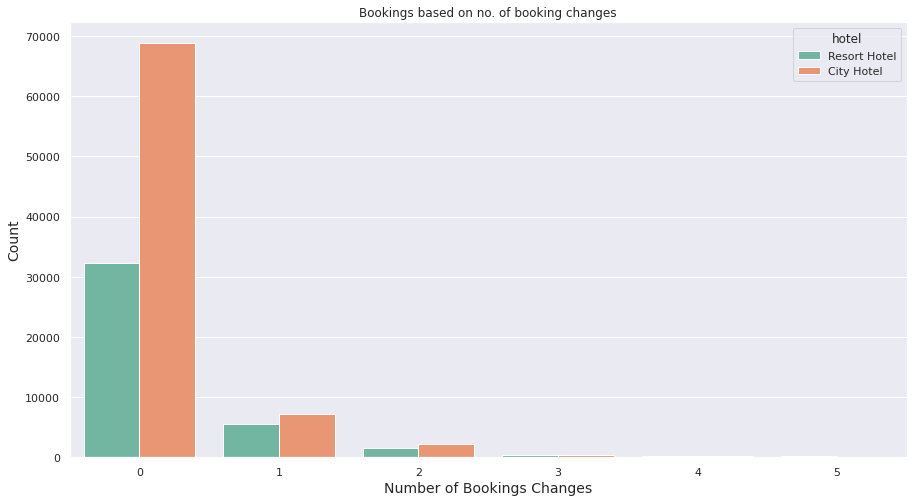

In [ ]:
# This graph shows Bookings based on no. of booking changes.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(x="booking_changes", hue="hotel", data=new_df)
graph.set(title='Bookings based on no. of booking changes')
graph.set_xlabel('Number of Bookings Changes',fontsize = 14)
graph.set_ylabel('Count',fontsize = 14)

Text(0, 0.5, 'Cancellations')

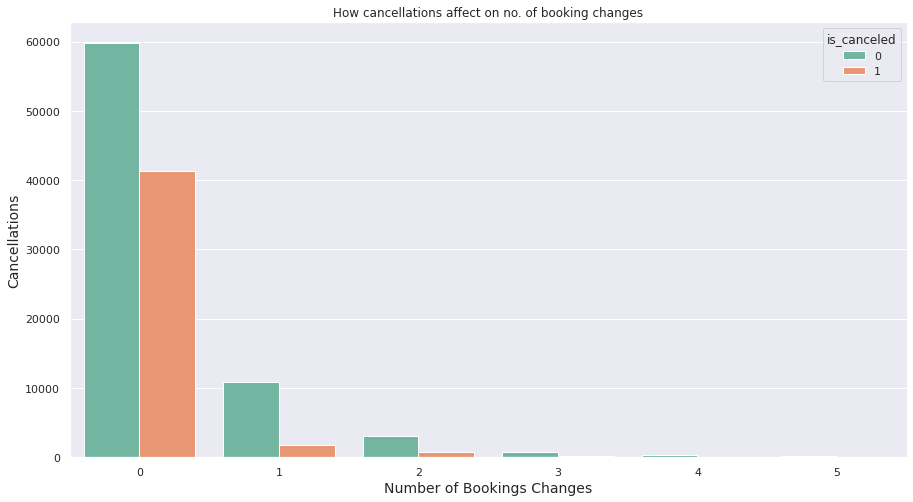

In [ ]:
# This graph shows How cancellations affect on no. of booking changes.
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(x="booking_changes", hue="is_canceled", data=new_df)
graph.set(title='How cancellations affect on no. of booking changes')
graph.set_xlabel('Number of Bookings Changes',fontsize = 14)
graph.set_ylabel('Cancellations',fontsize = 14)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0, 0.5, 'Number of Bookings')

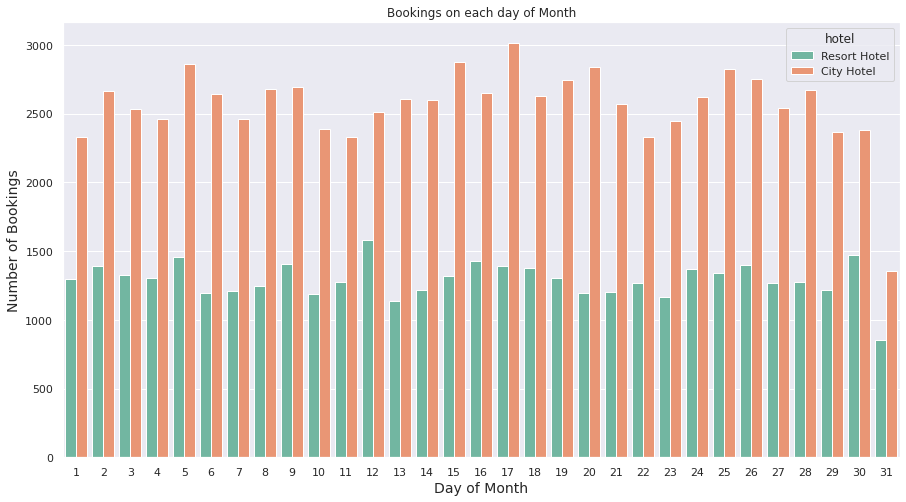

In [ ]:
# This graph shows Bookings on each day of Month
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set2")
graph = sns.countplot(df["arrival_date_day_of_month"], hue=df["hotel"], data=df)
graph.set(title='Bookings on each day of Month')
graph.set_xlabel('Day of Month',fontsize = 14)
graph.set_ylabel('Number of Bookings',fontsize = 14)

Most of the customer don't require the car parking spaces

## **Analysis based on Repeated Guest**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0, 0.5, 'Count')

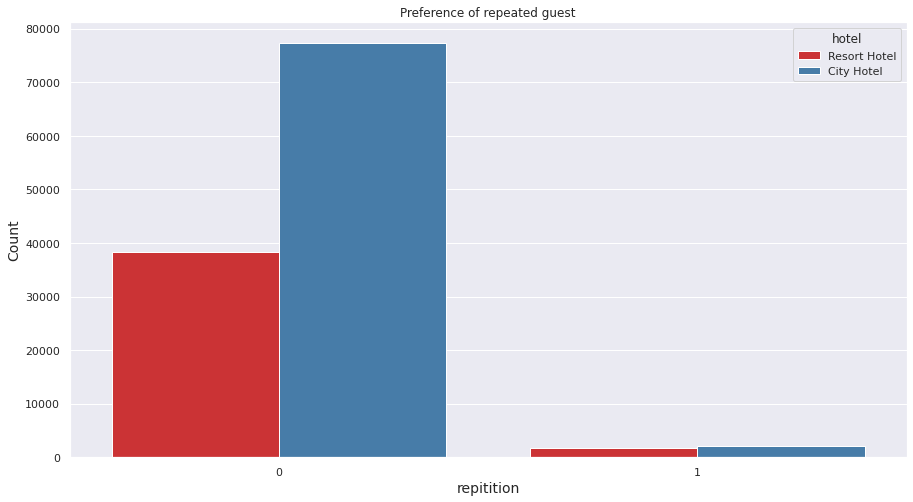

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(df["is_repeated_guest"], hue=df["hotel"], data=df)
graph.set(title='Preference of repeated guest')
graph.set_xlabel('repitition',fontsize = 14)
graph.set_ylabel('Count',fontsize = 14)

# Looking into revenue per month per hotel

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



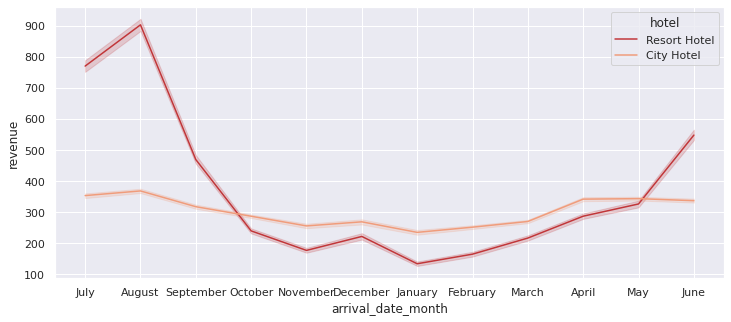

In [ ]:
# Resizing plot 
plt.figure(figsize=(12,5))

# Calculating average daily rate per person
# df['adr_pp'] = df['adr'] / (df['adults'] + df['children']) 
actual_guests = df.loc[df["is_canceled"] == 0]
actual_guests['revenue'] = actual_guests['adr'] * (actual_guests['stays_in_weekend_nights'] + actual_guests['stays_in_week_nights'])
sns.lineplot(data = actual_guests, x = 'arrival_date_month', y = 'revenue', hue = 'hotel')

Here we can conclude revenue of resort hotel are much higher. It seems that that is definitely the case since resort hotels specialise in that.
Revenue of city hotel do not fluctuate that much

In [ ]:
waiting_list_in_month=df.groupby(['arrival_date_month','hotel'])['days_in_waiting_list'].mean().reset_index().round(2)
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
waiting_list_in_month['arrival_date_month']=pd.Categorical(waiting_list_in_month['arrival_date_month'],categories=months,ordered=True)
waiting_list_in_month=waiting_list_in_month.sort_values('arrival_date_month')

waiting_list_in_month

,arrival_date_month,hotel,days_in_waiting_list
8,January,City Hotel,3.98
9,January,Resort Hotel,0.05
6,February,City Hotel,1.12
7,February,Resort Hotel,0.20
15,March,Resort Hotel,0.49
14,March,City Hotel,1.83
0,April,City Hotel,4.32
1,April,Resort Hotel,0.31
17,May,Resort Hotel,0.12
16,May,City Hotel,6.16


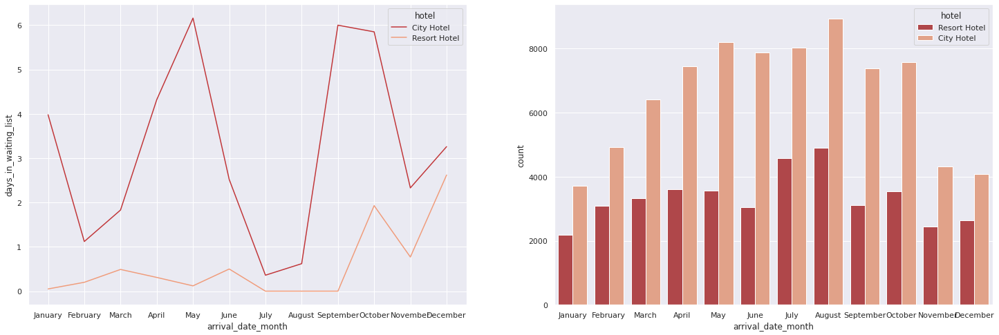

In [ ]:
# set lables
fig, axes = plt.subplots(1,2, figsize=(25, 8))

ax =sns.lineplot(ax=axes[0], x = 'arrival_date_month', y = 'days_in_waiting_list', hue = 'hotel', data=waiting_list_in_month)
# plt.title('Avg waitlist by months',fontsize = 18, fontweight='bold')
# plt.xlabel('Month')
# plt.ylabel('Count')

sns.countplot(ax=axes[1], data=new_df, x='arrival_date_month',hue='hotel')

##**Analysis based on Special Request**

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



Text(0, 0.5, 'Count')

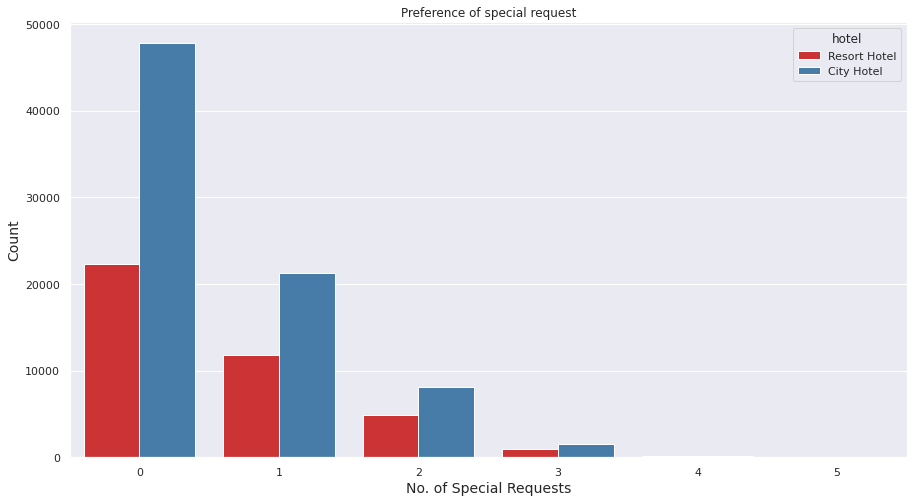

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
sns.set_palette("Set1")
graph = sns.countplot(new_df["total_of_special_requests"], hue=new_df["hotel"], data=new_df)
graph.set(title='Preference of special request')
graph.set_xlabel('No. of Special Requests',fontsize = 14)
graph.set_ylabel('Count',fontsize = 14)